# Stability Analysis VCF Comparison

## Table Of Contents

---
### [Step 1 - Initialization](#Step-1--Initialization)
<ol>
 <li>Imported Libraries</li>
 <li>Common Functions</li>
</ol>

### [Step 2 - Reading Files](#Step-2--Reading-Files)
<ol>
 <li>Reading CSV File (export <strong>'Export Sheet'</strong> as .csv <a href="https://docs.google.com/spreadsheets/d/1mDAMd1wk54RlQFEqKvuIQAwg_ajwCjZA7q2Lwkwx7Mo/edit?usp=sharing">from here</a>) </li>
 <li>Reading all generated VCF files from Google Drive (<a href="https://drive.google.com/drive/folders/1zdC_THQvRqXscc-scfM78cm8sCOADIjx?usp=sharing">download files from here</a>)</li>
 <li>Reading High Confidence VCF's</li>
 <li>Reading Paper Validated VCF's</li>
 <li>Plotting the intersection variants of High Confidence and Paper Validated VCF's</li>
</ol>

### [Step 3 - Filtering VCFs](#Step-3--Filtering-VCFs)
<ol>
 <li>Filtering each generated VCF</li>
 <li>Plotting Length counts of VCF's after each filtering steps</li>
</ol>

### [Step 4 - Matching Features](#Step-4--Matching-Features)
<ol>
 <li>Matching VCFs files with CSV file properties using the 'TestCaseNo' column</li>
 <li>Plotting All Variant Counts based on their 'Variant Callers' and 'Centers'</li>
 <li>Plotting All Variant Counts based on their 'Mapper, Variant Callers' and 'Centers'</li>
</ol>

### [Step 5 -  Execution Time Analysis](#Step-5--Execution-Time-Analysis)
<ol>
 <li>Plotting execution times</li>
</ol>

### [Step 6 -  Heatmaps](#Step-6--Heatmaps)
<ol>
 <li>Plotting execution times</li>
</ol>

### [Step 7 - Mean of Intersection/Union](#Step-7--Mean-of-Intersection/Union)
<ol>
 <li>Plotting execution times</li>
</ol>

## OUTLINE

### [Section - 1](#Section-1)
#### Import Section

### 0- Reading CSV File (export 'Export Sheet' as .csv)
    ## https://docs.google.com/spreadsheets/d/1mDAMd1wk54RlQFEqKvuIQAwg_ajwCjZA7q2Lwkwx7Mo/edit?usp=sharing
### 1- Reading all generated VCF files from Google Drive
    ## https://drive.google.com/drive/folders/1zdC_THQvRqXscc-scfM78cm8sCOADIjx?usp=sharing
### 2- Reading High Confidence and Paper Validated VCF's
    ## --> Result: high_confidence / all_validated_set
### 3- Filtering each generated VCF
    ## Remove indels & FilterPass --> Result: sets_dict[key]
### 4- Combine VCF Files and their features
    ## Combining CSV file with generated VCF TestCase IDs. --> Result: vcfcomparison_df_full
### 5- Find best parameter with XGBoost based on intersection/union with HighConfidence.
    ## intersection(generated & validated) / total generated VCF Variant Length.
    ## Install (!conda install -c conda-forge py-xgboost-cpu -y) & Uncomment codes.
### 6- Finding the same TestCases with same parameters.  
    ## --> Result: inter_testcase_dict
### 7 - Heatmap between Generated VCFs with Recall.
### 8 - Heatmap between Generated VCFs with Recall (Mappers)
### 9 - Heatmap between Generated VCFs with Recall (Callers)
### 10 - Heatmap between Generated VCFs with Recall (Environment)
### 11 - Heatmap between Generated VCFs with Recall (Equal TestCases / Environments.)
### 12 - Scatter plot between Generated VCFs with Recall/Precision. 
### 13 - Violin plot between Generated VCFs with Recall. (Changeable: Parameter based.)
### 14 - Venn diagrams between Generated VCFs. (Environment)
### 15 - Venn diagrams between Generated VCFs and High Confidence. (Environment)

## Step 1- Initialization 

### Imported Libraries

In [1]:
import os
import allel
import numpy as np
import matplotlib.pyplot as plt
import random
import community
from numpy import linalg as LA
from tqdm import tqdm
import pandas as pd
from scipy import stats, interpolate
import time
import seaborn as sns
import matplotlib.colors
import math
import scipy.io as sio
from skimage import data, segmentation, color
from skimage.future import graph
from sklearn.preprocessing import MinMaxScaler
import plotly.express as px
from matplotlib_venn import venn2, venn2_circles, venn2_unweighted, venn3, venn3_circles
from matplotlib import pyplot as plt, lines as Line2D
from xgboost import XGBClassifier, XGBRegressor, plot_importance
from venn import pseudovenn, venn
import plotly.io as pio

In [2]:
#!conda install -c conda-forge py-xgboost-cpu -y
pd.set_option('display.max_rows', 500)
pd.set_option('display.max_rows', 500)
pd.set_option('display.max_columns', 500)
pd.set_option('display.width', 1000)

### Common Funtions

In [3]:
#Deleting indels from VCF
def remove_indels(t):
    t = t[t["REF"].apply(len) == 1 ]
    t = t[t["ALT_1"].apply(len) == 1]
    return t 

#Apply Filters
def filtersControl(key,df,VCName):
    df = df.copy()
    #print(list(df.columns))
    #print(display(df.head()))
    #Getting variantCaller Name
    #VCName = key.split('/')
    
    #Apply Filter Pass if not somaticSniper
    #df = df if VCName == 'SomaticSniper' else df[df["FILTER_PASS"]=="SOMATIC"]
    
    #SOMATIC filter on strelka
    #df = df[df['SOMATIC'].astype("bool")] if VCName == 'Strelka' else df
    df = df if VCName == 'SomaticSniper' else df[df['FILTER_PASS'].astype("bool")== True]
    df = df[df['is_snp'].astype("bool")==True]
    return df

#Jaccard Similarity function for two sets ( int / )
def js_set(s1, s2):
    intersection = len(list(set(s1).intersection(s2)))
    union = uni(s1,s2)
    if union == 0:
        return 0;
    return np.float64(round((float(intersection) / union) * 100) / 100);

#The intersection of two sets is the set of all the common elements of both the sets. 
def intersec(s1,s2):
    return len(s1.intersection(s2))

#The union of two sets is the set of all the elements of both the sets without duplicates.
def uni(s1,s2):
    return len(s1.union(s2))

#The difference between two sets is the set of all the elements in first set that are not present in the second set. 
def dif(s1,s2):
    return len(s1.difference(s2))

#Percentage of intersects:
def percentage_intersects(intersection,count):
    return np.float64(round((float(intersection) / count) * 100) / 100);

def intersection_over_union(set1, set2):
    intersection_cardinality = len(set.intersection(*[set(set1), set(set2)]))
    union_cardinality = len(set.union(*[set(set1), set(set2)]))
    if union_cardinality == 0:
        return 0
    else:
        return intersection_cardinality / float(union_cardinality)

#intersection/union:
#def inter_union(s1,s2):
#    return np.float64(round((float(intersec(s1,s2) / uni(s1,s2))) * 100) / 100);
def inter_union(s1, s2):
    intersection = len(s1.intersection(s2))
    union = len(s1.union(s2))
    return round(intersection / union, 2)

# Get True Positives
def get_true_pos(pred, real):
    return len(pred & real);

# Get False Positives
def get_false_pos(pred, real):
    return len(pred - real);

# Get False Negatives
def get_false_neg(pred, real):
    return len(real - pred);

# Get TruePositive/FalsePositive
def get_precision(pred, real):
    tp = get_true_pos(pred, real) 
    fp = get_false_pos(pred, real) 
    return (1.0 * tp) / (tp + fp);

# Get TruePositive/FalseNegative
def get_recall(pred, real):
    tp = get_true_pos(pred, real)
    fn = get_false_neg(pred, real)
    return (1.0 * tp) / (tp + fn);

# Get TruePositive/FalseNegative
def get_f1score(pred, real):
    p = get_precision(pred,real)
    r = get_recall(pred, real)
    
    if(p + r == 0 ):
        return 0
    else:
        return (2.0 * ((p * r)/(p + r)));

def calculate_frequency(d):
    frequency = {}
    for key, values in tqdm(d.items()):
        for value in values:
            if (key, value) in frequency:
                frequency[(key, value)] += 1
            else:
                frequency[(key, value)] = 1
    return frequency

def create_dataframe(frequency_dict):
    df = pd.DataFrame(columns=["id", "list_item", "frequency"])
    for (key, value), freq in tqdm(frequency_dict.items()):
        df = df.append({"id": key, "list_item": value, "frequency": freq}, ignore_index=True)
    return df

## Step 2- Reading Files

### 1- Reading CSV File

In [4]:
#headerList=["TestCaseNo","phase","Sample","operatingSystem","Environment","isTrimmed","baseRecalibration","Mapper","M_Version","VariantCaller","VC_Version","ReferenceGenom","Duplicates","VariantFilter","FilterPass","SOMATICfilter","remove_indels","Sort","FileLink","Result VCF Count","Author"]
csv_file_df = pd.read_csv('vcf/TestCases.csv')
csv_file_df.head()

,TestCaseNo,phase,Sample,operatingSystem,HOW,isTrimmed,baseRecalibration,Mapper,M_Version,Variant Caller,VC_Version,ReferenceGenom,Duplicates,Variant Filter,FilterPass,SOMATICfilter,remove_indels,Sort,File Link,Result VCF Count,Kim yaptı :),Slurm_id,Donanım,ElapsedTime
0,TestCase 1,notReady,LL,Linux,Local,YES,YES,BWA,NaN,Mutect,NaN,hg19,MARK,NaN,NaN,NaN,NaN,NaN,NaN,NaN,GAMZE,NaN,NaN,NaN
1,TestCase 2,done,EA,Linux,Altay + COSAP,YES,YES,BWA,NaN,Mutect,NaN,hg38,MARK,NaN,NaN,NaN,NaN,NaN,https://drive.google.com/drive/folders/11CFGjN...,NaN,GUL EDA,29812.0,a047,07:15:00
2,TestCase 3,notReady,LL,NaN,Uhem + COSAP,YES,YES,BWA,NaN,Mutect,NaN,hg19,MARK,NaN,NaN,NaN,NaN,NaN,NaN,NaN,GÜL EDA,NaN,NaN,NaN
3,TestCase 4,notReady,LL,MAC,Local,YES,YES,BWA,NaN,Mutect,NaN,hg19,MARK,NaN,NaN,NaN,NaN,NaN,NaN,NaN,GAMZE,NaN,NaN,NaN
4,TestCase 5,notReady,LL,NaN,Altay + COSAP,YES,YES,BWA,NaN,Mutect,NaN,hg19,MARK,NaN,NaN,NaN,NaN,NaN,NaN,NaN,GÜL EDA,NaN,NaN,NaN


### 2- Reading all VCF files from Google Drive

In [5]:
vcf_filenames = {}
for root, directories, filenames in os.walk('vcf/TESTCASES_bedded'):
    for fn in filenames:
        if fn == '.DS_Store' or fn == 'fixed.recode.vcf' or fn == 'gatk.recode.vcf':
            continue;
        else:
            vcf_filenames[root[30:]] = os.path.join(root,fn)
            
print("Total file count:", len(vcf_filenames))
#vcf_filenames

Total file count: 480


In [6]:
vcfcomparison_df = pd.DataFrame(columns=["TestCase", "data", "mapper", "variantCaller", "VCFLength"])
vcfcomparison_df_full = pd.DataFrame(columns=["TestCaseNo","phase","Sample","operatingSystem","Environment","isTrimmed","baseRecalibration","Mapper","M_Version","VariantCaller","VC_Version","ReferenceGenom","Duplicates","VariantFilter","FilterPass","SOMATICfilter","remove_indels","Sort","FileLink","Result VCF Count","Author","Slurm_id","Node","ElapsedTime"])

for index, row in csv_file_df.iterrows():
    for key in vcf_filenames:
        if int(key)-1 == index:
            vcfcomparison_df.loc[len(vcfcomparison_df.index)] = [key , row[2],row[7],row[9],"0"] 
            vcfcomparison_df_full.loc[len(vcfcomparison_df_full.index)] = [row[0],row[1],row[2],row[3],row[4],row[5],row[6],row[7],row[8],row[9],row[10],row[11],row[12],row[13],row[14],row[15],row[16],row[17],row[18],"0",row[20],row[21],row[22],row[23]]

### 3- Reading High Confidence VCF's

In [7]:
# Validated VCF's
categories = ['LL', 'NC', 'EA', 'IL', 'FD']
all_filenames = {}

for category in tqdm(categories):
    category_filenames = {}
    for root, directories, filenames in os.walk(f'vcf/validated_vcfs/{category}'):
        for fn in filenames:
            if fn != '.DS_Store':
                category_filenames[root[22:]] = os.path.join(root, fn)
    all_filenames[category] = category_filenames

# Accessing filenames for LL category
#ll_filenames = all_filenames.get('LL', {})

100%|██████████| 5/5 [00:00<00:00, 546.02it/s]


In [8]:
def process_files(filenames):
    sets_dict = {}
    progression_bar = tqdm(filenames)
    for key in progression_bar:
        progression_bar.set_description("Processing « %s »" % key)
        temp = allel.vcf_to_dataframe(filenames[key], fields='variants/*')
        if len(temp) != 0:
            sets_dict[key] = set(temp[["CHROM", "POS", "REF", "ALT_1"]].apply(lambda row: "_".join(map(str, row)), axis=1))
    return sets_dict

ll_sets_dict = process_files(all_filenames.get('LL', {}))
nc_sets_dict = process_files(all_filenames.get('NC', {}))
ea_sets_dict = process_files(all_filenames.get('EA', {}))
il_sets_dict = process_files(all_filenames.get('IL', {}))
fd_sets_dict = process_files(all_filenames.get('FD', {}))

def print_set_count(name, all_validated_set):
    print(f"{name} Validated Set Count: {len(all_validated_set)}")
    
print_set_count("LL", set.intersection(*ll_sets_dict.values()))

Processing « bowtie/mutect »: 100%|██████████| 9/9 [00:07<00:00,  1.25it/s]       

LL Validated Set Count: 2388


### 4- Reading Paper Validated VCF's


In [9]:
temp = allel.vcf_to_dataframe('vcf/hc_bed_filtered.recode.vcf',fields='variants/*')
temp = remove_indels(temp)
high_confidence = set(temp[["CHROM","POS","REF","ALT_1"]].apply(lambda row: "_".join(map(str, row)), axis=1))

### 5- Plotting the intersection variants of High Confidence and Paper Validated VCF's

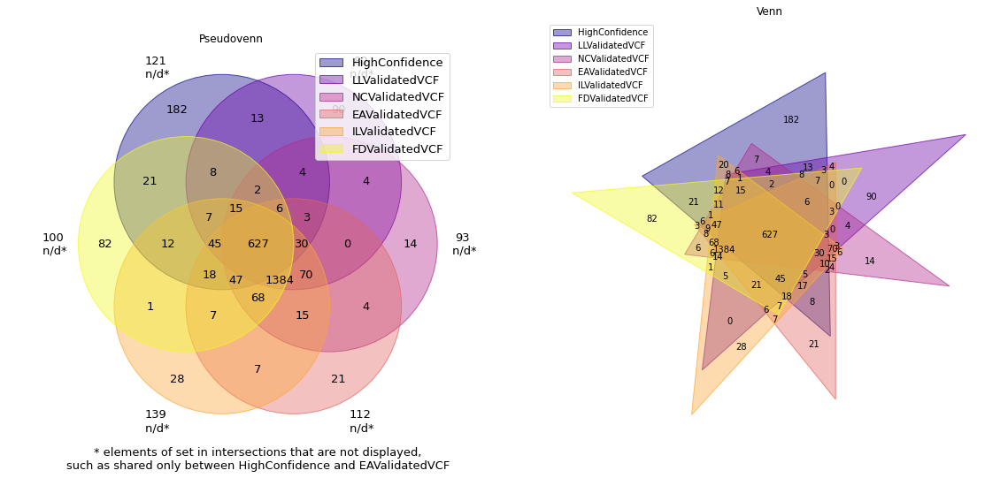

In [10]:
dataset_dict = {"HighConfidence":high_confidence,
                "LLValidatedVCF":set.intersection(*ll_sets_dict.values()),
                "NCValidatedVCF":set.intersection(*nc_sets_dict.values()),
                "EAValidatedVCF":set.intersection(*ea_sets_dict.values()),
                "ILValidatedVCF":set.intersection(*il_sets_dict.values()),
                "FDValidatedVCF":set.intersection(*fd_sets_dict.values())
               }

fig, axes = plt.subplots(1, 2, figsize=(20, 10))

# Plot pseudovenn on the first subplot
axes[0].set_title("Pseudovenn")
pseudovenn(dataset_dict, cmap="plasma", ax=axes[0])

# Plot venn on the second subplot
axes[1].set_title("Venn")
venn(dataset_dict, cmap="plasma", fontsize=10, legend_loc="upper left", ax=axes[1])

plt.show()

## Step 3- Filtering VCFs

### 1- Filtering each generated VCF

In [11]:
sets_dict = {}
filtering_data = []

vcf_comparison_dict = {row[0]: row[3] for _, row in vcfcomparison_df.iterrows()}

progression_bar = tqdm(vcf_filenames)
for key in progression_bar:
    # Creating a dataframe for each vcf.
    temp = allel.vcf_to_dataframe(vcf_filenames[key], fields='variants/*')
    progression_bar.set_description("Processing « %s »" % key)
    VCName = vcf_comparison_dict.get(key)
    
    total_len = len(temp)
    temp = remove_indels(filtersControl(key, temp, VCName))
    without_indels_len = len(temp)

    filtering_data.append((key, total_len, len(temp), without_indels_len))

    temp["Identifier"] = temp[["CHROM", "POS", "REF", "ALT_1"]].astype(str).agg("_".join, axis=1)
    sets_dict[key] = set(temp["Identifier"])

filtering_df = pd.DataFrame(filtering_data, columns=["Key", "Total Length", "After FilterPass", "After RemoveIndels"])


Processing « 817 »: 100%|██████████| 480/480 [02:01<00:00,  3.96it/s]


### 2-Plotting Length counts of VCF's after each filtering steps

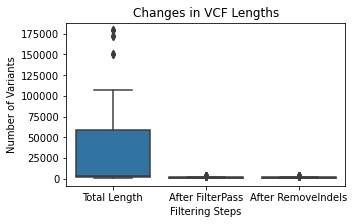

In [12]:
fig, ax = plt.subplots(figsize=(5, 3))

sns.boxplot(x="variable", y="value", data=pd.melt(filtering_df.drop("Key", axis=1)))

ax.set_xlabel("Filtering Steps")
ax.set_ylabel("Number of Variants")
ax.set_title("Changes in VCF Lengths")

plt.show()

## Step 4- Matching Features

### 1- Matching VCFs files with CSV file columns using the 'TestCaseNo' column

In [13]:
vcfcomparison_df = pd.DataFrame(columns=["TestCase", "data", "mapper", "variantCaller", "VCFLength"])
vcfcomparison_df_midi = pd.DataFrame(columns=["isTrimmed","baseRecalibration","Mapper","VariantCaller","ReferenceGenom","Duplicates"])
vcfcomparison_df_full = pd.DataFrame(columns=["TestCaseNo","phase","Sample","operatingSystem","Environment","isTrimmed","baseRecalibration","Mapper","M_Version","VariantCaller","VC_Version","ReferenceGenom","Duplicates","VariantFilter","FilterPass","SOMATICfilter","remove_indels","Sort","FileLink","Result VCF Count","Author","Slurm_id","Node","ElapsedTime"])

for index, row in csv_file_df.iterrows():
    for key in vcf_filenames:
        if int(key)-1 == index:
            vcfcomparison_df.loc[len(vcfcomparison_df.index)] = [key , row[2],row[7],row[9],len(sets_dict[key])] 
            vcfcomparison_df_midi.loc[len(vcfcomparison_df_midi.index)] = [row[5],row[6],row[7],row[9],row[11],row[12]]
            vcfcomparison_df_full.loc[len(vcfcomparison_df_full.index)] = [row[0],row[1],row[2],row[3],row[4],row[5],row[6],row[7],row[8],row[9],row[10],row[11],row[12],row[13],row[14],row[15],row[16],row[17],row[18],len(sets_dict[key]),row[20],row[21],row[22],row[23]]
            
vcfcomparison_df_full.head()

,TestCaseNo,phase,Sample,operatingSystem,Environment,isTrimmed,baseRecalibration,Mapper,M_Version,VariantCaller,VC_Version,ReferenceGenom,Duplicates,VariantFilter,FilterPass,SOMATICfilter,remove_indels,Sort,FileLink,Result VCF Count,Author,Slurm_id,Node,ElapsedTime
0,TestCase 2,done,EA,Linux,Altay + COSAP,YES,YES,BWA,NaN,Mutect,NaN,hg38,MARK,NaN,NaN,NaN,NaN,NaN,https://drive.google.com/drive/folders/11CFGjN...,1261,GUL EDA,29812.0,a047,07:15:00
1,TestCase 8,done,EA,Linux,Altay + COSAP,NO,NO,BWA,NaN,Mutect,NaN,hg38,MARK,NaN,NaN,NaN,NaN,NaN,https://drive.google.com/drive/folders/1I7r5au...,1276,GUL EDA,29812.0,a047,06:12:47
2,TestCase 14,done,EA,Linux,Altay + COSAP,YES,NO,BWA,NaN,Mutect,NaN,hg38,MARK,NaN,NaN,NaN,NaN,NaN,https://drive.google.com/drive/folders/1AN-msy...,1293,GUL EDA,29812.0,a047,05:48:51
3,TestCase 20,done,EA,Linux,Altay + COSAP,NO,YES,BWA,NaN,Mutect,NaN,hg38,MARK,NaN,NaN,NaN,NaN,NaN,https://drive.google.com/drive/folders/1hhxI84...,1237,GUL EDA,29812.0,a047,07:44:08
4,TestCase 26,done,EA,Linux,Altay + COSAP,YES,YES,BOWTIE,NaN,Mutect,NaN,hg38,MARK,NaN,NaN,NaN,NaN,NaN,https://drive.google.com/drive/folders/1sxq7kO...,1082,GUL EDA,29811.0,a078,07:36:41


### 2- Plotting All Variant Counts based on their 'Variant Callers' and 'Centers'

Text(0.5, 0.98, 'VariantCaller')

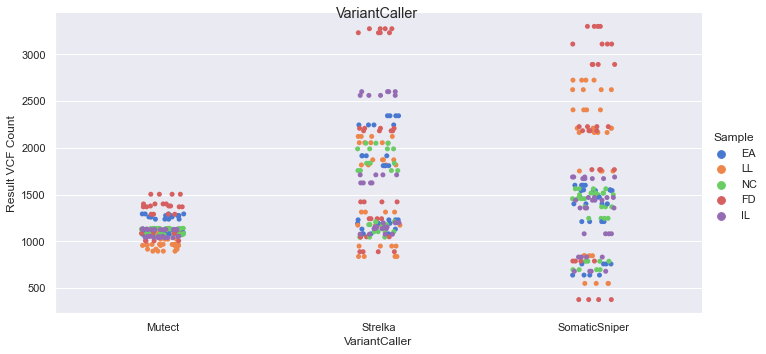

In [14]:
sns.set(rc={"figure.figsize":(3, 4)})
cp = sns.catplot(x='VariantCaller', y='Result VCF Count', data=vcfcomparison_df_full,hue='Sample',height=5, aspect=2,palette=sns.color_palette("muted"))
cp.fig.suptitle('VariantCaller')

### 3- Plotting All Variant Counts based on their 'Mapper, Variant Callers' and 'Centers'

In [15]:
fig = px.scatter(
    vcfcomparison_df_full,
    x="VariantCaller",
    y="Result VCF Count",
    color = "Mapper",
    symbol = "VariantCaller",
    facet_col= 'Sample',
    hover_data=['Environment','TestCaseNo'],
    color_discrete_sequence=sns.color_palette("muted").as_hex(),#['#55a3cd', '#4954b0', '#282739', '#3b2127', '#9c2f45', '#e96f36'], 
).update_layout(
    title={
        'y':0.95,
        'x':0.4,
        'xanchor': 'center',
        'yanchor': 'top'},
    yaxis_tickformat="%H:%M:%S",
    showlegend=True,
    title_text="Variant Count for each TestCase",
    font=dict(
        size=8
    )
)
fig.update_traces(marker = dict(size=6))
fig.show()

## Step 5- Execution Time Analysis

## 1 - Plotting execution times

In [16]:
df_timeTable = pd.DataFrame([
    [row['TestCaseNo'].split(' ')[1], row['Sample'], row['isTrimmed'], row['baseRecalibration'],
     row['Mapper'], row['VariantCaller'], row['Duplicates'], row['Node'], row['ElapsedTime'], row['Environment']]
    for _, row in vcfcomparison_df_full.iterrows()
], columns=["TestCase", "Sample", "isTrimmed", "baseRecalibration", "Mapper", "VariantCaller", "Duplicates", "Node", "ElapsedTime", "Environment"])

#df_timeTable.to_csv('sourceoftime.csv')


In [17]:
df_timeTable['baseRecalibration, isTrimmed'] = df_timeTable['baseRecalibration'] + ', ' + df_timeTable['isTrimmed']
df_timeTable['Mapper, VariantCaller'] = df_timeTable['Mapper'] + ', ' + df_timeTable['VariantCaller']

In [18]:
fig = px.scatter(
    df_timeTable,
    x="TestCase",
    y=pd.to_datetime(df_timeTable['ElapsedTime'], format='%H:%M:%S'),
    color = "Mapper, VariantCaller",
    symbol = "baseRecalibration, isTrimmed",
    facet_col= 'Sample',
    hover_data=['Mapper',"VariantCaller","baseRecalibration","isTrimmed","Duplicates"],
    color_discrete_sequence=['#55a3cd', '#4954b0', '#282739', '#e96f36', '#9c2f45', '#F2E34C'],
).update_layout(
    title={
        'y':0.95,
        'x':0.4,
        'xanchor': 'center',
        'yanchor': 'top'},
    yaxis_tickformat="%H:%M:%S",
    showlegend=True,
    title_text="Elapsed Time for each Pipeline",
    font=dict(
        size=10
    )
)
fig.update_traces(marker = dict(size=6))
fig.update_xaxes(title='Elapsed Time', visible=False, showticklabels=False)

fig.show()
#pio.write_image(fig, 'image.pdf',scale=6, width=985, height=620)

In [19]:
inter_testcase_dict = {row["TestCaseNo"].split(' ')[1]: "_".join(row[["Sample", "isTrimmed", "baseRecalibration", "Mapper", "VariantCaller", "ReferenceGenom", "Duplicates"]].astype(str))
                       for _, row in tqdm(vcfcomparison_df_full.iterrows())}


480it [00:00, 1475.09it/s]


## Step 6- Heatmaps

### 1 - Heatmap between Generated VCFs with Intersection / Union.

In [20]:
import pandas as pd
from tqdm import tqdm

# Preprocess data frame
vcfcomparison_df_full['TestCaseNo'] = vcfcomparison_df_full['TestCaseNo'].str.split(' ', expand=True)[1]

# Combine 'Mapper', 'VariantCaller', 'isTrimmed', 'baseRecalibration', 'Duplicates', 'Sample', 'Environment' columns
# into a single column 'CombinedKey'
vcfcomparison_df_full['CombinedKey'] = (vcfcomparison_df_full['Mapper'].str[:2] + '/' +
                                        vcfcomparison_df_full['VariantCaller'].str[:2] + '/' +
                                        vcfcomparison_df_full['isTrimmed'] + '/' +
                                        vcfcomparison_df_full['baseRecalibration'] + '/' +
                                        vcfcomparison_df_full['Duplicates'].str[:1] + '/' +
                                        vcfcomparison_df_full['TestCaseNo'] + '/' +
                                        vcfcomparison_df_full['Sample'] + '/' +
                                        vcfcomparison_df_full['Environment'].str[0]).str.lower()

# Initialize result data frames
df_generateds_r_p = pd.DataFrame(columns=["TestCase1", "TestCase2", "Inter/Union"])
df_ll = pd.DataFrame(columns=["TestCase1", "TestCase2", "Inter/Union"])
df_nc = pd.DataFrame(columns=["TestCase1", "TestCase2", "Inter/Union"])
df_ea = pd.DataFrame(columns=["TestCase1", "TestCase2", "Inter/Union"])
df_fd = pd.DataFrame(columns=["TestCase1", "TestCase2", "Inter/Union"])
df_il = pd.DataFrame(columns=["TestCase1", "TestCase2", "Inter/Union"])

# Create tqdm progress bar
progress_bar = tqdm(sets_dict, desc="Processing")

# Initialize index counters
index_r_p = 0
index_ll = 0
index_nc = 0
index_ea = 0
index_fd = 0
index_il = 0

# Iterate over sets_dict
for key in progress_bar:
    progress_bar.set_description("Processing « %s »" % key)
    vcf_key = vcfcomparison_df_full['TestCaseNo'] == key
    filtered_vcf = vcfcomparison_df_full[vcf_key]
    new_key = (filtered_vcf['Mapper'].str[:2] + '/' + filtered_vcf['VariantCaller'].str[:2] + '/' +
               filtered_vcf['isTrimmed'] + '/' + filtered_vcf['baseRecalibration'] + '/' +
               filtered_vcf['Duplicates'].str[:1] + '/' + key + '/' + filtered_vcf['Sample']).str.lower() + '/' + \
              filtered_vcf['Environment'].str[0]

    for key2 in sets_dict:
        vcf_key2 = vcfcomparison_df_full['TestCaseNo'] == key2
        filtered_vcf2 = vcfcomparison_df_full[vcf_key2]
        new_key2 = (filtered_vcf2['Mapper'].str[:2] + '/' + filtered_vcf2['VariantCaller'].str[:2] + '/' +
                    filtered_vcf2['isTrimmed'] + '/' + filtered_vcf2['baseRecalibration'] + '/' +
                    filtered_vcf2['Duplicates'].str[:1] + '/' + key2 + '/' + filtered_vcf2['Sample']).str.lower() + '/' + \
                   filtered_vcf2['Environment'].str[0]

        # Compute intersection/union once
        inter_union_result = inter_union(sets_dict[key], sets_dict[key2])

        # Use vectorized operations to check conditions and update data frames
        if (new_key.str.split('/', expand=True)[6] == "ll").all() and (new_key2.str.split('/', expand=True)[6] == "ll").all():
            df_ll.at[index_ll, ["TestCase1", "TestCase2", "Inter/Union"]] = [new_key.iloc[0], new_key2.iloc[0], inter_union_result]
            index_ll += 1

        if (new_key.str.split('/', expand=True)[6] == "nc").all() and (new_key2.str.split('/', expand=True)[6] == "nc").all():
            df_nc.at[index_nc, ["TestCase1", "TestCase2", "Inter/Union"]] = [new_key.iloc[0], new_key2.iloc[0], inter_union_result]
            index_nc += 1

        if (new_key.str.split('/', expand=True)[6] == "ea").all() and (new_key2.str.split('/', expand=True)[6] == "ea").all():
            df_ea.at[index_ea, ["TestCase1", "TestCase2", "Inter/Union"]] = [new_key.iloc[0], new_key2.iloc[0], inter_union_result]
            index_ea += 1

        if (new_key.str.split('/', expand=True)[6] == "fd").all() and (new_key2.str.split('/', expand=True)[6] == "fd").all():
            df_fd.at[index_fd, ["TestCase1", "TestCase2", "Inter/Union"]] = [new_key.iloc[0], new_key2.iloc[0], inter_union_result]
            index_fd += 1

        if (new_key.str.split('/', expand=True)[6] == "il").all() and (new_key2.str.split('/', expand=True)[6] == "il").all():
            df_il.at[index_il, ["TestCase1", "TestCase2", "Inter/Union"]] = [new_key.iloc[0], new_key2.iloc[0], inter_union_result]
            index_il += 1

        #df_generateds_r_p.at[index_r_p, ["TestCase1", "TestCase2", "Inter/Union"]] = [new_key.iloc[0], new_key2.iloc[0], inter_union_result]
        df_generateds_r_p.loc[len(df_generateds_r_p.index)] = [new_key.iloc[0], new_key2.iloc[0], inter_union_result]

        index_r_p += 1

Processing « 817 »: 100%|██████████| 480/480 [1:24:08<00:00, 10.52s/it]


### 2 - Plotting Heatmap with cluster

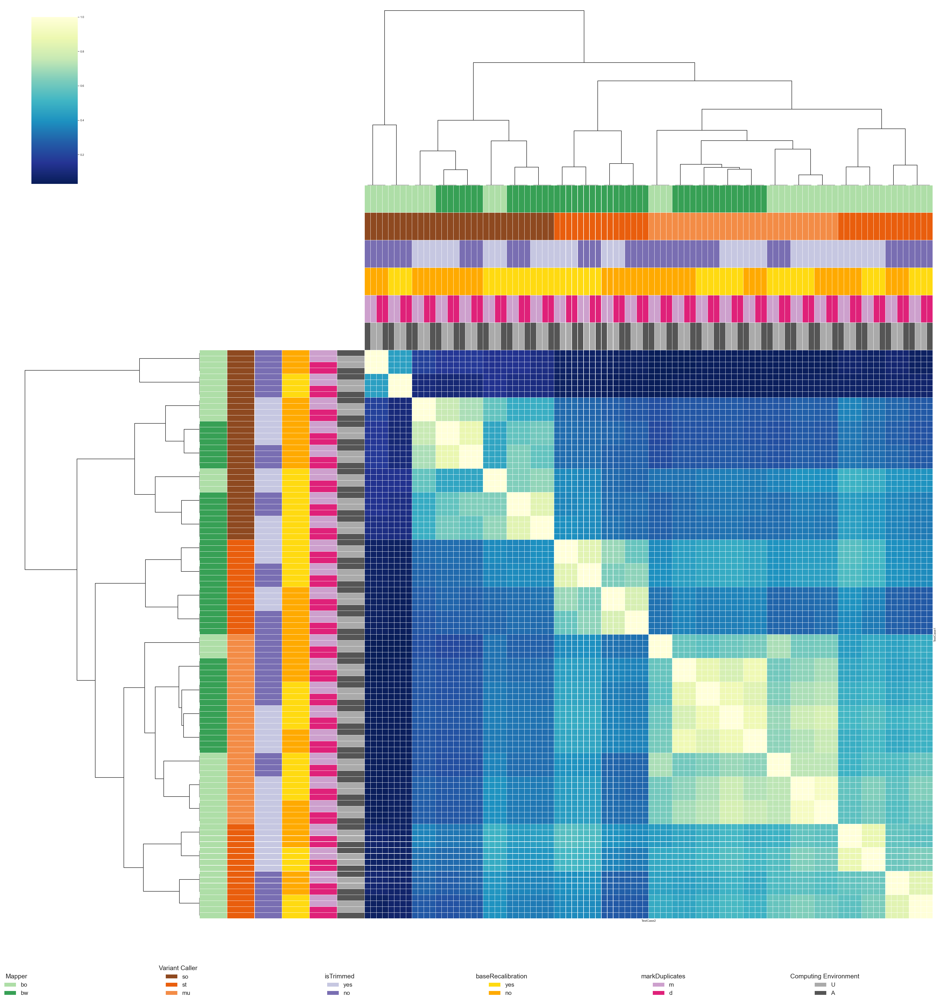

In [25]:
df_nc["Inter/Union"] = df_nc["Inter/Union"].astype(float)
df_generateds_nc = df_nc.pivot_table(index='TestCase1', columns='TestCase2', values='Inter/Union')

df_ll["Inter/Union"] = df_ll["Inter/Union"].astype(float)
df_generateds_ll = df_ll.pivot_table(index='TestCase1', columns='TestCase2', values='Inter/Union')

df_ea["Inter/Union"] = df_ea["Inter/Union"].astype(float)
df_generateds_ea = df_ea.pivot_table(index='TestCase1', columns='TestCase2', values='Inter/Union')

df_fd["Inter/Union"] = df_fd["Inter/Union"].astype(float)
df_generateds_fd = df_fd.pivot_table(index='TestCase1', columns='TestCase2', values='Inter/Union')

df_il["Inter/Union"] = df_il["Inter/Union"].astype(float)
df_generateds_il = df_il.pivot_table(index='TestCase1', columns='TestCase2', values='Inter/Union')


df = df_generateds_fd.copy()

mapper = df.index.str.split('/').str[0]
lut1 = dict(zip(set(mapper), sns.color_palette("Greens", len(set(mapper)))))
row_colors1 = pd.Series(mapper, index=df.index).map(lut1)

variantCollor = df.index.str.split('/').str[1]
lut2 = dict(zip(set(variantCollor), sns.color_palette("Oranges_d", len(set(variantCollor)))))
row_colors2 = pd.Series(variantCollor, index=df.index).map(lut2)

isTrimmed = df.index.str.split('/').str[2]
lut3 = dict(zip(set(isTrimmed), sns.color_palette("Purples", len(set(isTrimmed)))))
row_colors3 = pd.Series(isTrimmed, index=df.index).map(lut3)

baseRecalibration = df.index.str.split('/').str[3]
lut4 = dict(zip(set(baseRecalibration), sns.color_palette("Wistia", len(set(baseRecalibration)))))
row_colors4 = pd.Series(baseRecalibration, index=df.index).map(lut4)

markDuplicates = df.index.str.split('/').str[4]
lut5 = dict(zip(set(markDuplicates), sns.color_palette("PuRd", len(set(markDuplicates)))))
row_colors5 = pd.Series(markDuplicates, index=df.index).map(lut5)

environment = df.index.str.split('/').str[7]
lut6 = dict(zip(set(environment), sns.color_palette("binary", len(set(environment)))))
row_colors6 = pd.Series(environment, index=df.index).map(lut6)

color_array = [row_colors1,row_colors2,row_colors3,row_colors4,row_colors5,row_colors6]
sns.set(font_scale=1)
g = sns.clustermap(df, col_cluster=True, linewidths=0.1, figsize=(50,50),cmap="YlGnBu_r", row_colors=color_array,col_colors=color_array,yticklabels=False,xticklabels=False)

for a in g.ax_row_dendrogram.collections:
    a.set_linewidth(2)

for a in g.ax_col_dendrogram.collections:
    a.set_linewidth(2)
    

from matplotlib.patches import Patch
import matplotlib.pyplot as plt
from matplotlib.gridspec import GridSpec
from matplotlib.patches import Patch

# Create legends
legends = [lut1, lut2, lut3, lut4, lut5, lut6]
colors = ["Greens", "Oranges_d", "Purples", "Wistia", "PuRd", "binary"]
titles = ["Mapper", "Variant Caller", "isTrimmed", "baseRecalibration", "markDuplicates", "Computing Environment"]
legend_params = {'fontsize': 23, 'title_fontsize': 25}

fig = g.fig

gs = GridSpec(1, 6, figure=fig, wspace=0.5)
for i in range(6):
    ax = fig.add_subplot(gs[0, i])
    handles = [Patch(facecolor=legends[i][name]) for name in legends[i]]
    ax.legend( handles, legends[i], title=titles[i], loc="lower center", frameon=False,bbox_to_anchor=(0,-0.09),**legend_params)
    ax.axis("off")
    
plt.savefig("heatmap_fd.pdf", format="pdf", bbox_inches="tight")

plt.show()


## Step 7- Mean of Intersection/Union

### 1- Visualizing Mean Intersection/Union Values for SNVs

In [22]:
# Filter conditions
conditions = [
    (df_generateds_r_p['TestCase1'].str.split('/').str[:5] == df_generateds_r_p['TestCase2'].str.split('/').str[:5]),
    (df_generateds_r_p['TestCase1'].str.split('/').str[7] != df_generateds_r_p['TestCase2'].str.split('/').str[7])
]

# Apply filters
filtered_df = df_generateds_r_p[conditions[0] & conditions[1]]

# Print the filtered DataFrame
filtered_df.head()

,TestCase1,TestCase2,Inter/Union
140,bw/mu/no/no/d/296/ea/A,bw/mu/no/no/d/794/il/U,0.71
192,bw/mu/no/no/d/296/ea/A,bw/mu/no/no/d/444/nc/U,0.68
210,bw/mu/no/no/d/296/ea/A,bw/mu/no/no/d/613/fd/U,0.49
213,bw/mu/no/no/d/296/ea/A,bw/mu/no/no/d/442/ea/U,1.00
465,bw/mu/no/no/d/296/ea/A,bw/mu/no/no/d/441/ll/U,0.59


In [23]:
df_generateds_r_p.head()

,TestCase1,TestCase2,Inter/Union
0,bw/mu/no/no/d/296/ea/A,bw/mu/no/no/d/296/ea/A,1.00
1,bw/mu/no/no/d/296/ea/A,bo/so/no/yes/d/606/fd/U,0.04
2,bw/mu/no/no/d/296/ea/A,bw/so/no/yes/m/262/ea/U,0.44
3,bw/mu/no/no/d/296/ea/A,bo/st/yes/yes/d/853/il/A,0.60
4,bw/mu/no/no/d/296/ea/A,bw/st/yes/no/d/639/fd/A,0.26


/Users/P33833/miniconda3/envs/mywork2/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/Users/P33833/miniconda3/envs/mywork2/lib/python3.6/site-packages/ipykernel_launcher.py:33: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/Users/P33833/miniconda3/envs/mywork2/lib/python3.6/site-packages/ipykernel_launcher.py:45: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value ins

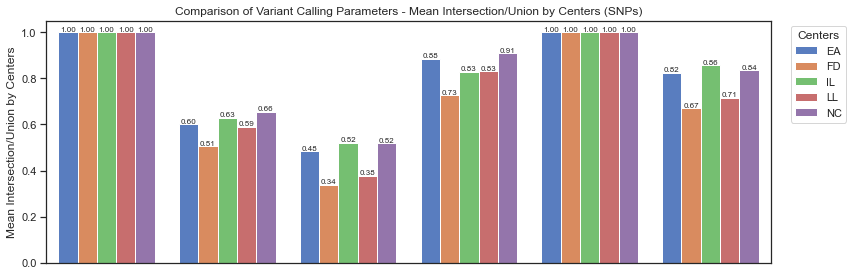

In [24]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Create a copy of the original DataFrame
df_copy = df_generateds_r_p.copy()

# Splitting the 'TestCase1' and 'TestCase2' columns into separate columns
df_copy[['Mapper1', 'VariantCaller1', 'IsTrimmed1', 'BaseRecalibration1', 'MarkingDuplicates1', 'TestCaseNo1', 'Sample1', 'Environment1']] = df_copy['TestCase1'].str.split('/', expand=True)
df_copy[['Mapper2', 'VariantCaller2', 'IsTrimmed2', 'BaseRecalibration2', 'MarkingDuplicates2', 'TestCaseNo2', 'Sample2', 'Environment2']] = df_copy['TestCase2'].str.split('/', expand=True)

grouped_df = pd.DataFrame() 
filtered_df_environment = df_copy[(df_copy['Mapper1'] == df_copy['Mapper2']) &
                      (df_copy['VariantCaller1'] == df_copy['VariantCaller2']) &
                      (df_copy['BaseRecalibration1'] == df_copy['BaseRecalibration2']) &
                      (df_copy['MarkingDuplicates1'] == df_copy['MarkingDuplicates2']) &
                      (df_copy['Sample1'] == df_copy['Sample2']) &
                      (df_copy['IsTrimmed1'] == df_copy['IsTrimmed2']) &
                      (df_copy['Environment1'] != df_copy['Environment2'])]

filtered_df_environment['Inter/Union'] = pd.to_numeric(filtered_df_environment['Inter/Union'], errors='coerce')
grouped_df_e = filtered_df_environment.groupby('Sample1')['Inter/Union'].mean().reset_index()
grouped_df_e['Parameter'] = 'Computing Environment'

filtered_df_mapper = df_copy[(df_copy['Mapper1'] != df_copy['Mapper2']) &
                      (df_copy['VariantCaller1'] == df_copy['VariantCaller2']) &
                      (df_copy['BaseRecalibration1'] == df_copy['BaseRecalibration2']) &
                      (df_copy['MarkingDuplicates1'] == df_copy['MarkingDuplicates2']) &
                      (df_copy['Sample1'] == df_copy['Sample2']) &
                      (df_copy['IsTrimmed1'] == df_copy['IsTrimmed2']) &
                      (df_copy['Environment1'] == df_copy['Environment2'])]

filtered_df_mapper['Inter/Union'] = pd.to_numeric(filtered_df_mapper['Inter/Union'], errors='coerce')
grouped_df_m = filtered_df_mapper.groupby('Sample1')['Inter/Union'].mean().reset_index()
grouped_df_m['Parameter'] = 'Mapper'

filtered_df_variantCaller = df_copy[(df_copy['Mapper1'] == df_copy['Mapper2']) &
                      (df_copy['VariantCaller1'] != df_copy['VariantCaller2']) &
                      (df_copy['BaseRecalibration1'] == df_copy['BaseRecalibration2']) &
                      (df_copy['MarkingDuplicates1'] == df_copy['MarkingDuplicates2']) &
                      (df_copy['Sample1'] == df_copy['Sample2']) &
                      (df_copy['IsTrimmed1'] == df_copy['IsTrimmed2']) &
                      (df_copy['Environment1'] == df_copy['Environment2'])]

filtered_df_variantCaller['Inter/Union'] = pd.to_numeric(filtered_df_variantCaller['Inter/Union'], errors='coerce')
grouped_df_vc = filtered_df_variantCaller.groupby('Sample1')['Inter/Union'].mean().reset_index()
grouped_df_vc['Parameter'] = 'Variant Caller'

filtered_df_baseRecalibration = df_copy[(df_copy['Mapper1'] == df_copy['Mapper2']) &
                      (df_copy['VariantCaller1'] == df_copy['VariantCaller2']) &
                      (df_copy['BaseRecalibration1'] != df_copy['BaseRecalibration2']) &
                      (df_copy['MarkingDuplicates1'] == df_copy['MarkingDuplicates2']) &
                      (df_copy['Sample1'] == df_copy['Sample2']) &
                      (df_copy['IsTrimmed1'] == df_copy['IsTrimmed2']) &
                      (df_copy['Environment1'] == df_copy['Environment2'])]

filtered_df_baseRecalibration['Inter/Union'] = pd.to_numeric(filtered_df_baseRecalibration['Inter/Union'], errors='coerce')
grouped_df_br = filtered_df_baseRecalibration.groupby('Sample1')['Inter/Union'].mean().reset_index()
grouped_df_br['Parameter'] = 'Base Recalibration'

filtered_df_markDuplicates = df_copy[(df_copy['Mapper1'] == df_copy['Mapper2']) &
                      (df_copy['VariantCaller1'] == df_copy['VariantCaller2']) &
                      (df_copy['BaseRecalibration1'] == df_copy['BaseRecalibration2']) &
                      (df_copy['MarkingDuplicates1'] != df_copy['MarkingDuplicates2']) &
                      (df_copy['Sample1'] == df_copy['Sample2']) &
                      (df_copy['IsTrimmed1'] == df_copy['IsTrimmed2']) &
                      (df_copy['Environment1'] == df_copy['Environment2'])]

filtered_df_markDuplicates['Inter/Union'] = pd.to_numeric(filtered_df_markDuplicates['Inter/Union'], errors='coerce')
grouped_df_md = filtered_df_markDuplicates.groupby('Sample1')['Inter/Union'].mean().reset_index()
grouped_df_md['Parameter'] = 'Mark Duplicates'

filtered_df_isTrimmed = df_copy[(df_copy['Mapper1'] == df_copy['Mapper2']) &
                      (df_copy['VariantCaller1'] == df_copy['VariantCaller2']) &
                      (df_copy['BaseRecalibration1'] == df_copy['BaseRecalibration2']) &
                      (df_copy['MarkingDuplicates1'] == df_copy['MarkingDuplicates2']) &
                      (df_copy['Sample1'] == df_copy['Sample2']) &
                      (df_copy['IsTrimmed1'] != df_copy['IsTrimmed2']) &
                      (df_copy['Environment1'] == df_copy['Environment2'])]

filtered_df_isTrimmed['Inter/Union'] = pd.to_numeric(filtered_df_isTrimmed['Inter/Union'], errors='coerce')
grouped_df_it = filtered_df_isTrimmed.groupby('Sample1')['Inter/Union'].mean().reset_index()
grouped_df_it['Parameter'] = 'Trimming'

# Concatenating all the grouped DataFrames
grouped_df = pd.concat([grouped_df_e, grouped_df_m, grouped_df_vc, grouped_df_br, grouped_df_md, grouped_df_it])
grouped_df['Sample1'] = grouped_df['Sample1'].str.upper()

# Plotting the bar plot
sns.set(style="ticks")
plt.figure(figsize=(12, 4))
ax = sns.barplot(data=grouped_df, x='Parameter', y='Inter/Union', hue='Sample1', ci=None,palette=sns.color_palette("muted"))
    
# Add data labels to the bars
for p in ax.patches:
    ax.annotate(format(p.get_height(), '.2f'),
                (p.get_x() + p.get_width() / 2, p.get_height()),
                ha='center',
                va='bottom',fontsize = 8)
ax.set(xticklabels=[])  # remove the tick labels
ax.tick_params(bottom=False)  # remove the ticks
ax.set(xlabel=None)  # remove the axis label

#plt.xlabel('Variant Calling Parameters')
plt.ylabel('Mean Intersection/Union by Centers')
plt.title('Comparison of Variant Calling Parameters - Mean Intersection/Union by Centers (SNPs)')
plt.legend(title='Centers', bbox_to_anchor=(1.02, 1), loc='upper left')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

## 9 - Heatmap between Generated VCFs with Recall (Callers)

In [26]:
df_generateds_r_p_m = pd.DataFrame(columns=["TestCase1", "TestCase2", "Inter/Union"]) #mutect
df_generateds_r_p_s = pd.DataFrame(columns=["TestCase1", "TestCase2", "Inter/Union"]) #strelka
df_generateds_r_p_ss = pd.DataFrame(columns=["TestCase1", "TestCase2", "Inter/Union"]) #somaticsniper

df_generateds_r_p_m_ll = pd.DataFrame(columns=["TestCase1", "TestCase2", "Inter/Union"]) #mutect
df_generateds_r_p_s_ll = pd.DataFrame(columns=["TestCase1", "TestCase2", "Inter/Union"]) #strelka
df_generateds_r_p_ss_ll = pd.DataFrame(columns=["TestCase1", "TestCase2", "Inter/Union"]) #somaticsniper

df_generateds_r_p_m_nc = pd.DataFrame(columns=["TestCase1", "TestCase2", "Inter/Union"]) #mutect
df_generateds_r_p_s_nc = pd.DataFrame(columns=["TestCase1", "TestCase2", "Inter/Union"]) #strelka
df_generateds_r_p_ss_nc = pd.DataFrame(columns=["TestCase1", "TestCase2", "Inter/Union"]) #somaticsniper

for index, row in tqdm(df_generateds_r_p.iterrows()):
    if 'mu' == row['TestCase1'].split('/')[1] and 'mu' == row['TestCase2'].split('/')[1]:
        df_generateds_r_p_m.loc[len(df_generateds_r_p_m.index)] = row
    elif 'st' == row['TestCase1'].split('/')[1] and 'st' == row['TestCase2'].split('/')[1]:
        df_generateds_r_p_s.loc[len(df_generateds_r_p_s.index)] = row    
    elif 'so' == row['TestCase1'].split('/')[1] and 'so' == row['TestCase2'].split('/')[1]:
        df_generateds_r_p_ss.loc[len(df_generateds_r_p_ss.index)] = row      
        
        
    if "nc" == row['TestCase1'].split('/')[6] and "nc" == row['TestCase2'].split('/')[6]:
        if 'mu' == row['TestCase1'].split('/')[1] and 'mu' == row['TestCase2'].split('/')[1]:
            df_generateds_r_p_m_nc.loc[len(df_generateds_r_p_m_nc.index)] = row
        elif 'st' == row['TestCase1'].split('/')[1] and 'st' == row['TestCase2'].split('/')[1]:
            df_generateds_r_p_s_nc.loc[len(df_generateds_r_p_s_nc.index)] = row    
        elif 'so' == row['TestCase1'].split('/')[1] and 'so' == row['TestCase2'].split('/')[1]:
            df_generateds_r_p_ss_nc.loc[len(df_generateds_r_p_ss_nc.index)] = row  
    
    elif "ll" == row['TestCase1'].split('/')[6] and "ll" == row['TestCase2'].split('/')[6]:
        if 'mu' == row['TestCase1'].split('/')[1] and 'mu' == row['TestCase2'].split('/')[1]:
            df_generateds_r_p_m_ll.loc[len(df_generateds_r_p_m_ll.index)] = row
        elif 'st' == row['TestCase1'].split('/')[1] and 'st' == row['TestCase2'].split('/')[1]:
            df_generateds_r_p_s_ll.loc[len(df_generateds_r_p_s_ll.index)] = row    
        elif 'so' == row['TestCase1'].split('/')[1] and 'so' == row['TestCase2'].split('/')[1]:
            df_generateds_r_p_ss_ll.loc[len(df_generateds_r_p_ss_ll.index)] = row 

230400it [04:39, 823.11it/s] 


In [ ]:
import pandas as pd
from tqdm import tqdm

categories = ['nc', 'll', 'default']
df_dict = {type_: {category: pd.DataFrame(columns=["TestCase1", "TestCase2", "Inter/Union"]) for category in categories} for type_ in ['mu', 'st', 'so']}

for index, row in tqdm(df_generateds_r_p.iterrows()):
    test_case_1_type, test_case_2_type = row['TestCase1'].split('/')[1], row['TestCase2'].split('/')[1]
    test_case_1_category, test_case_2_category = row['TestCase1'].split('/')[6], row['TestCase2'].split('/')[6]

    if test_case_1_type == test_case_2_type:
        df_generateds_r_p_type_category = df_dict.get(test_case_1_type, {}).get(test_case_1_category, df_dict.get(test_case_1_type, {}).get('default', pd.DataFrame()))
        df_generateds_r_p_type_category.loc[len(df_generateds_r_p_type_category.index)] = row

# Access the DataFrames as needed
df_generateds_r_p_m = df_dict['mu']['default']
df_generateds_r_p_s = df_dict['st']['default']
df_generateds_r_p_ss = df_dict['so']['default']

df_generateds_r_p_m_nc = df_dict['mu']['nc']
df_generateds_r_p_s_nc = df_dict['st']['nc']
df_generateds_r_p_ss_nc = df_dict['so']['nc']

df_generateds_r_p_m_ll = df_dict['mu']['ll']
df_generateds_r_p_s_ll = df_dict['st']['ll']
df_generateds_r_p_ss_ll = df_dict['so']['ll']


In [65]:
#Variant Caller based 
#df_generateds_r_p_m
#df_generateds_r_p_s
#df_generateds_r_p_ss
#df_generateds_r_p_m_ll
#df_generateds_r_p_s_ll
#df_generateds_r_p_ss_ll
#df_generateds_r_p_m_nc
#df_generateds_r_p_s_nc
#df_generateds_r_p_ss_nc


df_generateds_r_m = df_generateds_r_p_ss_nc.pivot_table(index='TestCase1', columns='TestCase2', values='Inter/Union')
plt.figure(figsize = (200,200), dpi=40)
sns.set(font_scale=15)
ax = sns.heatmap(df_generateds_r_m, annot=False, cmap="YlGnBu_r") #annot_kws={"size": 200}
ax.set_title('somaticSniper NC generated VCF Inter/Union  Comparison', fontdict={'fontsize': 300, 'fontweight': 'medium'})

fig = ax.get_figure()

In [ ]:
#df_generateds_r_p_m
#df_generateds_r_p_s
#df_generateds_r_p_ss
#df_generateds_r_p_m_ll
#df_generateds_r_p_s_ll
#df_generateds_r_p_ss_ll
#df_generateds_r_p_m_nc
#df_generateds_r_p_s_nc
#df_generateds_r_p_ss_nc

df_generateds_r = df_generateds_r_p_m.pivot_table(index='TestCase1', columns='TestCase2', values='Inter/Union')

sns.set(font_scale=5)
g = sns.clustermap(df_generateds_r,figsize=(100,100))
g.fig.suptitle('somaticSniper LL generated VCF Inter/Union  Comparison',y=1.0)

for a in g.ax_row_dendrogram.collections:
    a.set_linewidth(10)

for a in g.ax_col_dendrogram.collections:
    a.set_linewidth(10)

In [265]:
sns.set(font_scale=5)
g = sns.clustermap(df_generateds_fd,figsize=(200,200))
g.fig.suptitle('FD generated VCF Inter/Union  Comparison',y=1.0)

for a in g.ax_row_dendrogram.collections:
    a.set_linewidth(10)

for a in g.ax_col_dendrogram.collections:
    a.set_linewidth(10)

ValueError: The condensed distance matrix must contain only finite values.

## 12 - Scatter plot between Generated VCFs with Recall/Precision. 

In [321]:
df_generateds_r_p_VALIDATED =  pd.DataFrame(columns=["TestCase", "Inter/Union", "Precision", "Recall","f1_score"])

for key in tqdm(sets_dict):
        for index, row in vcfcomparison_df_full.iterrows():
            if key == row['TestCaseNo']:
                if row['Environment'] == 'Uhem + COSAP':
                    env_name = "s"
                elif row['Environment'] == 'Altay + COSAP':
                    env_name = "a"
                newKey = (row['Mapper'] + '/' + row['VariantCaller']+ '/' + row['isTrimmed'] + '/' + row['baseRecalibration'] + '/' + row['Duplicates'][0] + '/' + key + '/' + row['Sample'] + '/' + env_name).lower() 
        df_generateds_r_p_VALIDATED.loc[len(df_generateds_r_p_VALIDATED.index)] = [newKey, intersection_over_union(sets_dict[key],high_confidence),get_precision(sets_dict[key],high_confidence),get_recall(sets_dict[key],high_confidence), get_f1score(sets_dict[key],high_confidence)]


100%|██████████| 480/480 [00:23<00:00, 20.33it/s]


In [ ]:
#df_generateds_r_p_VALIDATED
#df_generateds_r_p_VALIDATED.to_csv('df_generateds_r_p_VALIDATED.csv')

In [322]:
df = df_generateds_r_p_VALIDATED.copy()

mapping_dict = {
    'Environment': {'Uhem + COSAP': 'sarıyer', '': 'altay'},
    'isTrimmed': {'YES': 'YES', '': 'NO'},
    'baseRecalibration': {'YES': 'YES', '': 'NO'},
    'Duplicates': {'MARK': 'MARK', '': 'DELETE'},
    'Mapper': {'BWA': 'BWA', '': 'BOWTIE'},
    'VariantCaller': {'Mutect': 'Mutect', 'SomaticSniper': 'SomaticSniper', '': 'Strelka'},
    'Sample': {'LL': 'll', 'NC': 'nc', 'EA': 'ea', 'FD': 'fd', 'IL': 'il'}
}

default_values = {
    'Environment': 'altay',
    'isTrimmed': 'NO',
    'baseRecalibration': 'NO',
    'Duplicates': 'DELETE',
    'Mapper': 'BOWTIE',
    'VariantCaller': 'Strelka',
    'Sample': ''
}

for index, row in tqdm(df.iterrows()):
    for index1, row2 in vcfcomparison_df_full.iterrows():
        if row["TestCase"].split('/')[5] == row2["TestCaseNo"]:
            for column, mapping in mapping_dict.items():
                value = mapping.get(row2[column])
                if value is None:
                    value = default_values.get(column)
                df.at[index, column] = value


480it [00:24, 19.67it/s]


In [ ]:
#df_4 = df.copy()
#result = []
#
#for index, row in tqdm(df.iterrows()):
#    result.append(row['TestCase'].split('/')[5])
#
#df_4['TestCase'] = result
#df_4 = df_4.drop(['Inter/Union','Precision','Recall'],axis = 1)
#df_4.to_csv('sourceofvariation.csv')

In [68]:
df_ll_r_p_f1 = pd.DataFrame(columns=["TestCase", "Inter/Union", "Precision", "Recall","f1_score"])
df_nc_r_p_f1 = pd.DataFrame(columns=["TestCase", "Inter/Union", "Precision", "Recall","f1_score"])
df_ea_r_p_f1 = pd.DataFrame(columns=["TestCase", "Inter/Union", "Precision", "Recall","f1_score"])
df_fd_r_p_f1 = pd.DataFrame(columns=["TestCase", "Inter/Union", "Precision", "Recall","f1_score"])
df_il_r_p_f1 = pd.DataFrame(columns=["TestCase", "Inter/Union", "Precision", "Recall","f1_score"])



for index, row  in tqdm(df.iterrows()):
    if "ll" == row['TestCase'].split('/')[6]:
        df_ll_r_p_f1.loc[len(df_ll_r_p_f1.index)] = row
    elif "nc" == row['TestCase'].split('/')[6]:
        df_nc_r_p_f1.loc[len(df_nc_r_p_f1.index)] = row
    elif "ea" == row['TestCase'].split('/')[6]:
        df_ea_r_p_f1.loc[len(df_ea_r_p_f1.index)] = row
    elif "fd" == row['TestCase'].split('/')[6]:
        df_fd_r_p_f1.loc[len(df_fd_r_p_f1.index)] = row
    elif "il" == row['TestCase'].split('/')[6]:
        df_il_r_p_f1.loc[len(df_il_r_p_f1.index)] = row

        
df_ll_r_p_f1_pivotted = df_ll_r_p_f1.pivot_table(index='TestCase', values=['Precision','Recall','f1_score'])
df_nc_r_p_f1_pivotted = df_nc_r_p_f1.pivot_table(index='TestCase', values=['Precision','Recall','f1_score'])
df_fd_r_p_f1_pivotted = df_fd_r_p_f1.pivot_table(index='TestCase', values=['Precision','Recall','f1_score'])
df_ea_r_p_f1_pivotted = df_ea_r_p_f1.pivot_table(index='TestCase', values=['Precision','Recall','f1_score'])
df_il_r_p_f1_pivotted = df_il_r_p_f1.pivot_table(index='TestCase', values=['Precision','Recall','f1_score'])

480it [00:01, 333.75it/s]


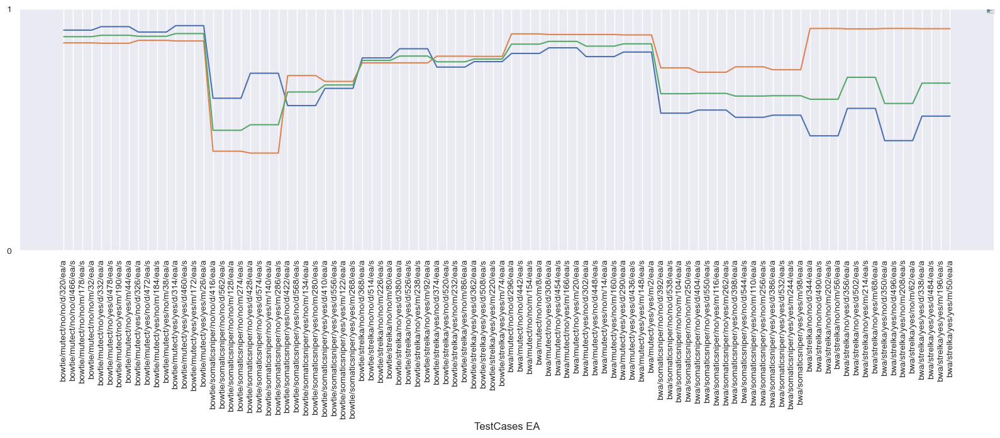

In [69]:
plot_df = df_ea_r_p_f1_pivotted.copy()

ax = plot_df.plot(kind='line', figsize=(20, 5),fontsize=10)
ax.set_xticklabels(plot_df.index,rotation=90)
ax.set_xticks(range(len(plot_df.index)))
ax.set_xlabel("TestCases EA", fontsize=12)
plt.ylim(0, 1.00)
ax.legend(fontsize=1)

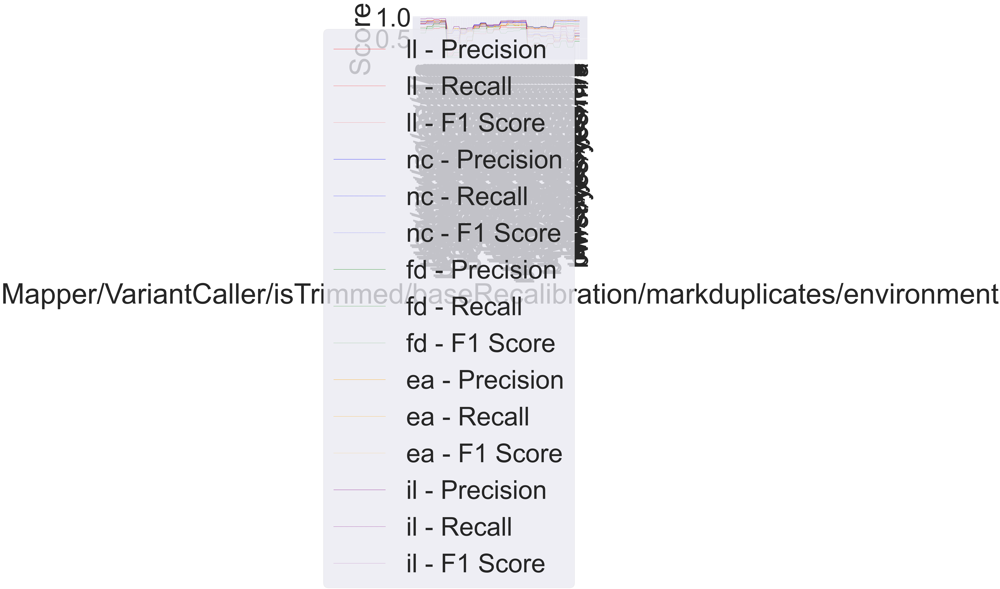

In [70]:
import pandas as pd
import matplotlib.pyplot as plt

# Combine the five dataframes into a single dataframe
dfs = [df_ll_r_p_f1_pivotted, df_nc_r_p_f1_pivotted, df_fd_r_p_f1_pivotted, df_ea_r_p_f1_pivotted, df_il_r_p_f1_pivotted]
combined_df = pd.concat(dfs)

# Extract the relevant columns for plotting
plot_data = combined_df.reset_index()

# Extract the components from the index
plot_data[['Mapper', 'VariantCaller', 'isTrimmed', 'baseRecalibration', 'markduplicates', 'testcaseno', 'sample', 'workingenvironment']] = plot_data['TestCase'].str.split('/', expand=True)

# Create a new column based on existing columns
plot_data['combined_environment'] = plot_data['Mapper'].str[:2] + '/' + plot_data['VariantCaller'].str[:2] + '/' + plot_data['isTrimmed'] + '/' + plot_data['baseRecalibration'] + '/' + plot_data['markduplicates'].str[:1] + '/' + plot_data['workingenvironment']

# Set up the plot
fig, ax = plt.subplots(figsize=(20, 5))

# Iterate over each sample and plot the lines
samples = plot_data['sample'].unique()
colors = ['red', 'blue', 'green', 'orange', 'purple']  # Adjust colors as desired

for sample, color in zip(samples, colors):
    sample_data = plot_data[plot_data['sample'] == sample]
    ax.plot(sample_data['combined_environment'], sample_data['Precision'], label=f'{sample} - Precision', color=color)
    ax.plot(sample_data['combined_environment'], sample_data['Recall'], label=f'{sample} - Recall', linestyle='--', color=color)
    ax.plot(sample_data['combined_environment'], sample_data['f1_score'], label=f'{sample} - F1 Score', linestyle=':', color=color)

# Set the x-axis label
ax.set_xlabel('Mapper/VariantCaller/isTrimmed/baseRecalibration/markduplicates/environment')

# Set the y-axis label
ax.set_ylabel('Score')

# Add a legend
ax.legend()

# Rotate x-axis labels if needed
plt.xticks(rotation=90)

# Show the plot
plt.show()


In [71]:
fig = px.scatter(df, x="Recall", y="Precision", facet_col= 'Sample', symbol = 'VariantCaller',color="Mapper",hover_data=['Environment'],color_discrete_sequence=['#55a3cd', '#4954b0', '#282739', '#3b2127', '#9c2f45', '#e96f36'])
fig.update_traces(marker = dict(size=12))
fig.show()

In [323]:
temp = df

In [324]:
temp

,TestCase,Inter/Union,Precision,Recall,f1_score,Environment,isTrimmed,baseRecalibration,Duplicates,Mapper,VariantCaller,Sample
0,bwa/mutect/no/no/d/296/ea/a,0.7457020057,0.8158307210,0.8966408269,0.8543290931,altay,NO,NO,DELETE,BWA,Mutect,ea
1,bowtie/somaticsniper/no/yes/d/606/fd/s,0.0469707284,0.1830238727,0.0594315245,0.0897269181,sarıyer,NO,YES,DELETE,BOWTIE,SomaticSniper,fd
2,bwa/somaticsniper/no/yes/m/262/ea/s,0.4822734947,0.5818058384,0.7381567614,0.6507213364,sarıyer,NO,YES,MARK,BWA,SomaticSniper,ea
3,bowtie/strelka/yes/yes/d/853/il/a,0.7052321297,0.8300086730,0.8242894057,0.8271391530,altay,YES,YES,DELETE,BOWTIE,Strelka,il
4,bwa/strelka/yes/no/d/639/fd/a,0.2879765396,0.3039306716,0.8458225668,0.4471766849,altay,YES,NO,DELETE,BWA,Strelka,fd
5,bwa/mutect/no/yes/d/601/fd/s,0.5818406424,0.6728571429,0.8113695090,0.7356501367,sarıyer,NO,YES,DELETE,BWA,Mutect,fd
6,bowtie/strelka/no/no/d/854/il/a,0.6803218727,0.8186619718,0.8010335917,0.8097518502,altay,NO,NO,DELETE,BOWTIE,Strelka,il
7,bwa/mutect/yes/no/d/637/fd/a,0.5908521303,0.6843251089,0.8122308355,0.7428121308,altay,YES,NO,DELETE,BWA,Mutect,fd
8,bowtie/somaticsniper/no/no/d/862/il/a,0.3966362999,0.6802884615,0.4875107666,0.5679879579,altay,NO,NO,DELETE,BOWTIE,SomaticSniper,il
9,bowtie/mutect/no/yes/m/608/fd/s,0.6130653266,0.7863720074,0.7355727821,0.7601246106,sarıyer,NO,YES,MARK,BOWTIE,Mutect,fd


No handles with labels found to put in legend.


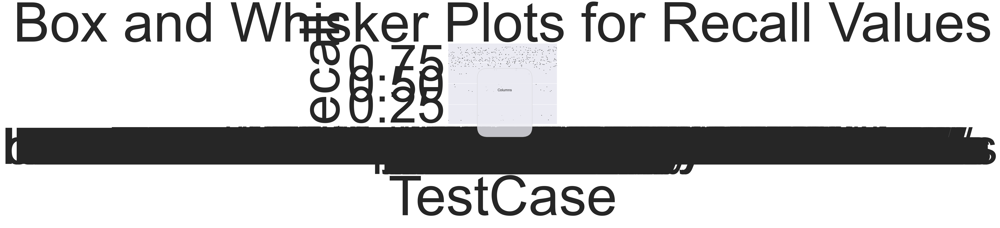

In [91]:
columns_to_plot = ['Mapper', 'VariantCaller', 'baseRecalibration', 'isTrimmed']

# Create a single boxplot with all columns
#plt.figure(figsize=(12, 8))
sns.boxplot(x='TestCase', y='Recall', data=temp)
plt.title('Box and Whisker Plots for Recall Values')
#plt.xlabel('Category')
#plt.ylabel('Recall')
#plt.legend(title='Columns', loc='upper right')
plt.show()

In [97]:
df

,TestCase,Inter/Union,Precision,Recall,f1_score,Environment,isTrimmed,baseRecalibration,Duplicates,Mapper,VariantCaller,Sample,"baseRecalibration, isTrimmed","Mapper, VariantCaller"
0,bwa/mutect/no/no/d/296/ea/a,0.745702,0.815831,0.896641,0.854329,altay,NO,NO,DELETE,BWA,Mutect,ea,"NO, NO","BWA, Mutect"
1,bowtie/somaticsniper/no/yes/d/606/fd/s,0.046971,0.183024,0.059432,0.089727,sarıyer,NO,YES,DELETE,BOWTIE,SomaticSniper,fd,"YES, NO","BOWTIE, SomaticSniper"
2,bwa/somaticsniper/no/yes/m/262/ea/s,0.482273,0.581806,0.738157,0.650721,sarıyer,NO,YES,MARK,BWA,SomaticSniper,ea,"YES, NO","BWA, SomaticSniper"
3,bowtie/strelka/yes/yes/d/853/il/a,0.705232,0.830009,0.824289,0.827139,altay,YES,YES,DELETE,BOWTIE,Strelka,il,"YES, YES","BOWTIE, Strelka"
4,bwa/strelka/yes/no/d/639/fd/a,0.287977,0.303931,0.845823,0.447177,altay,YES,NO,DELETE,BWA,Strelka,fd,"NO, YES","BWA, Strelka"
5,bwa/mutect/no/yes/d/601/fd/s,0.581841,0.672857,0.811370,0.735650,sarıyer,NO,YES,DELETE,BWA,Mutect,fd,"YES, NO","BWA, Mutect"
6,bowtie/strelka/no/no/d/854/il/a,0.680322,0.818662,0.801034,0.809752,altay,NO,NO,DELETE,BOWTIE,Strelka,il,"NO, NO","BOWTIE, Strelka"
7,bwa/mutect/yes/no/d/637/fd/a,0.590852,0.684325,0.812231,0.742812,altay,YES,NO,DELETE,BWA,Mutect,fd,"NO, YES","BWA, Mutect"
8,bowtie/somaticsniper/no/no/d/862/il/a,0.396636,0.680288,0.487511,0.567988,altay,NO,NO,DELETE,BOWTIE,SomaticSniper,il,"NO, NO","BOWTIE, SomaticSniper"
9,bowtie/mutect/no/yes/m/608/fd/s,0.613065,0.786372,0.735573,0.760125,sarıyer,NO,YES,MARK,BOWTIE,Mutect,fd,"YES, NO","BOWTIE, Mutect"


In [328]:
!pip install pingouin


     |████████████████████████████████| 198 kB 1.6 MB/s            
     |████████████████████████████████| 185 kB 7.1 MB/s            
  Preparing metadata (setup.py) ... done
  Using cached numpy-1.19.5-cp36-cp36m-macosx_10_9_x86_64.whl (15.6 MB)
     |████████████████████████████████| 183 kB 6.4 MB/s            
  Preparing metadata (setup.py) ... done
     |████████████████████████████████| 182 kB 6.6 MB/s            
  Preparing metadata (setup.py) ... done
     |████████████████████████████████| 206 kB 6.2 MB/s            
  Preparing metadata (setup.py) ... done
     |████████████████████████████████| 205 kB 7.5 MB/s            
  Preparing metadata (setup.py) ... done
     |████████████████████████████████| 736 kB 6.2 MB/s            
  Preparing metadata (setup.py) ... done
  Created wheel for pingouin: filename=pingouin-0.3.12-py3-none-any.whl size=204286 sha256=215e4a424a18711eb63c1c3ab6cea9b16d61366db1809b1d8137957f320f8498
  Stored in directory: /Users/P33833/Library/Cache

In [333]:
import pandas as pd
import pingouin as pg

# Assuming your DataFrame is named 'df'
# Extract the relevant data for each VariantCaller
data = temp[['VariantCaller', 'Precision']]
data['VariantCaller'] = data['VariantCaller'].astype('category')
print(data['Precision'].isnull().sum())

# Perform paired t-tests
result = pg.pairwise_ttests(dv='Precision', within='VariantCaller', data=data)

# Print the results
print(result)


0


/Users/P33833/miniconda3/envs/mywork2/lib/python3.6/site-packages/ipykernel_launcher.py:7: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



TypeError: 'NoneType' object is not callable

In [327]:
temp


,TestCase,Inter/Union,Precision,Recall,f1_score,Environment,isTrimmed,baseRecalibration,Duplicates,Mapper,VariantCaller,Sample
0,bwa/mutect/no/no/d/296/ea/a,0.7457020057,0.8158307210,0.8966408269,0.8543290931,altay,NO,NO,DELETE,BWA,Mutect,ea
1,bowtie/somaticsniper/no/yes/d/606/fd/s,0.0469707284,0.1830238727,0.0594315245,0.0897269181,sarıyer,NO,YES,DELETE,BOWTIE,SomaticSniper,fd
2,bwa/somaticsniper/no/yes/m/262/ea/s,0.4822734947,0.5818058384,0.7381567614,0.6507213364,sarıyer,NO,YES,MARK,BWA,SomaticSniper,ea
3,bowtie/strelka/yes/yes/d/853/il/a,0.7052321297,0.8300086730,0.8242894057,0.8271391530,altay,YES,YES,DELETE,BOWTIE,Strelka,il
4,bwa/strelka/yes/no/d/639/fd/a,0.2879765396,0.3039306716,0.8458225668,0.4471766849,altay,YES,NO,DELETE,BWA,Strelka,fd
5,bwa/mutect/no/yes/d/601/fd/s,0.5818406424,0.6728571429,0.8113695090,0.7356501367,sarıyer,NO,YES,DELETE,BWA,Mutect,fd
6,bowtie/strelka/no/no/d/854/il/a,0.6803218727,0.8186619718,0.8010335917,0.8097518502,altay,NO,NO,DELETE,BOWTIE,Strelka,il
7,bwa/mutect/yes/no/d/637/fd/a,0.5908521303,0.6843251089,0.8122308355,0.7428121308,altay,YES,NO,DELETE,BWA,Mutect,fd
8,bowtie/somaticsniper/no/no/d/862/il/a,0.3966362999,0.6802884615,0.4875107666,0.5679879579,altay,NO,NO,DELETE,BOWTIE,SomaticSniper,il
9,bowtie/mutect/no/yes/m/608/fd/s,0.6130653266,0.7863720074,0.7355727821,0.7601246106,sarıyer,NO,YES,MARK,BOWTIE,Mutect,fd


In [74]:
temp['baseRecalibration, isTrimmed'] = temp['baseRecalibration'] + ', ' + temp['isTrimmed']
temp['Mapper, VariantCaller'] = temp['Mapper'] + ', ' + temp['VariantCaller']


In [76]:
fig = px.scatter(
    temp,
    x="TestCase",
    y="Recall",
    color = "Mapper, VariantCaller",
    symbol = "baseRecalibration, isTrimmed",
    facet_col= 'Sample',
    hover_data=['Mapper',"VariantCaller","baseRecalibration","isTrimmed","Duplicates"],
    color_discrete_sequence=['#55a3cd', '#4954b0', '#282739', '#e96f36', '#9c2f45', '#F2E34C'],
).update_layout(
    title={
        'y':0.95,
        'x':0.4,
        'xanchor': 'center',
        'yanchor': 'top'},
    showlegend=True,
    title_text="Recall values for each Pipeline",
    font=dict(
        size=10
    )
)
fig.update_traces(marker = dict(size=6))
fig.update_xaxes(title='Recall', visible=False, showticklabels=False)

fig.show()

In [193]:
temp = df.drop(['baseRecalibration, isTrimmed', 'Mapper, VariantCaller','f1_score_difference'], axis=1)

In [357]:
import pandas as pd
from scipy.stats import ttest_rel

static = 'Recall'

# Filter rows 
filtered_df_ma = df[df['Mapper'].isin(['BWA', 'BOWTIE']) & ~df[static].isnull()]
filtered_df_br = df[df['baseRecalibration'].isin(['YES', 'NO']) & ~df[static].isnull()]
filtered_df_it = df[df['isTrimmed'].isin(['YES', 'NO']) & ~df[static].isnull()]


# Separate data for YES and NO filtered_df_br  :: Mapper
yes_data_ma = filtered_df_ma[filtered_df_ma['Mapper'] == 'BWA'][static]
no_data_ma = filtered_df_ma[filtered_df_ma['Mapper'] == 'BOWTIE'][static]

# Separate data for YES and NO filtered_df_br  :: VariantCaller
mutect_scores = df[df['VariantCaller'] == 'Mutect'][static]
somaticsniper_scores = df[df['VariantCaller'] == 'SomaticSniper'][static]
strelka_scores = df[df['VariantCaller'] == 'Strelka'][static]

# Separate data for YES and NO filtered_df_br  :: baseRecalibration
yes_data_br = filtered_df_br[filtered_df_br['baseRecalibration'] == 'YES'][static]
no_data_br = filtered_df_br[filtered_df_br['baseRecalibration'] == 'NO'][static]

# Separate data for YES and NO filtered_df_it :: isTrimmed
yes_data_it = filtered_df_it[filtered_df_it['isTrimmed'] == 'YES'][static]
no_data_it = filtered_df_it[filtered_df_it['isTrimmed'] == 'NO'][static]

# Perform paired difference test
t_stat_ma, p_value_ttest_ma = ttest_rel(yes_data_ma, no_data_ma)
t_stat_br, p_value_ttest_br = ttest_rel(yes_data_br, no_data_br)
t_stat_it, p_value_ttest_it = ttest_rel(yes_data_it, no_data_it)

##Variant Caller
t_stat, p_value = stats.f_oneway(mutect_scores, somaticsniper_scores, strelka_scores)


t_statistic_ms, p_value_ms = ttest_rel(mutect_scores, somaticsniper_scores)
t_statistic_mst, p_value_mst = ttest_rel(mutect_scores, strelka_scores)
t_statistic_st, p_value_st = ttest_rel(somaticsniper_scores, strelka_scores)



print(f"Mapper                    :: T-Test: t-statistic = {t_stat_br}, p-value = {p_value_ttest_br}\n")

print(f"Mutect vs. SomaticSniper  :: T-Test: t-statistic = {t_statistic_ms}, p-value:{p_value_ms}")
print(f"Mutect vs. Strelka        :: T-Test: t-statistic = {t_statistic_mst}, p-value:{p_value_mst}")
print(f"SomaticSniper vs. Strelka :: T-Test: t-statistic = {t_statistic_st}, p-value:{p_value_st}\n")

print(f"variantCaller stats.f_oneway  :: T-Test: t-statistic = {t_stat}, p-value = {p_value}\n")

print(f"baseRecalibration         :: T-Test: t-statistic = {t_stat_br}, p-value = {p_value_ttest_br}")
print(f"isTrimmed                 :: T-Test: t-statistic = {t_stat_it}, p-value = {p_value_ttest_it}")


Mapper                    :: T-Test: t-statistic = -0.4841207683330841, p-value = 0.6287434760886994

Mutect vs. SomaticSniper  :: T-Test: t-statistic = 11.507124047657467, p-value:1.125046299661192e-22
Mutect vs. Strelka        :: T-Test: t-statistic = 1.6144026241758103, p-value:0.10842288094673362
SomaticSniper vs. Strelka :: T-Test: t-statistic = -10.374720739377167, p-value:1.3941888785185552e-19

variantCaller stats.f_oneway  :: T-Test: t-statistic = 105.81295945450714, p-value = 9.281130311052261e-39

baseRecalibration         :: T-Test: t-statistic = -0.4841207683330841, p-value = 0.6287434760886994
isTrimmed                 :: T-Test: t-statistic = 5.699516768802164, p-value = 3.5233866985997325e-08


/Users/P33833/miniconda3/envs/mywork2/lib/python3.6/site-packages/ipykernel_launcher.py:33: DeprecationWarning:

elementwise comparison failed; this will raise an error in the future.



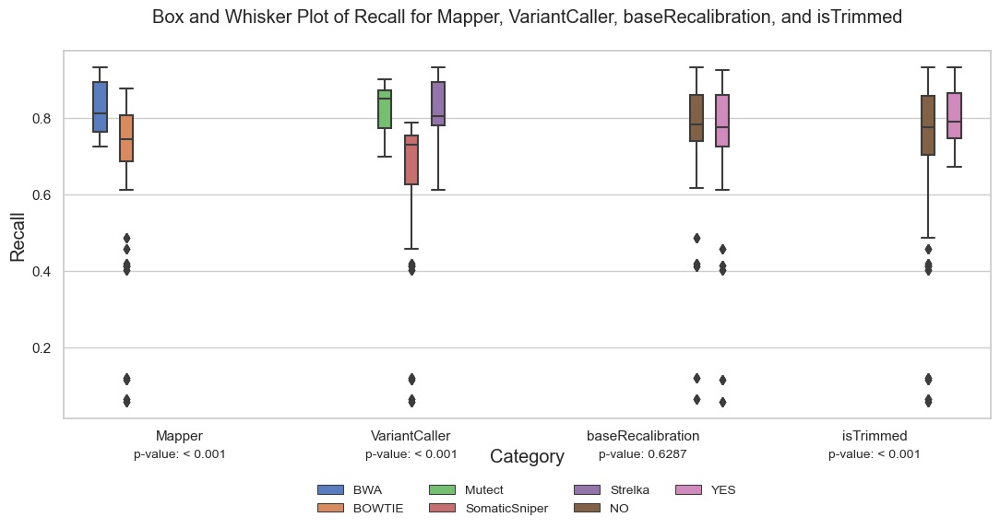

In [360]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import ttest_rel

plt.rcdefaults()

# Assuming your DataFrame is named df
# If not, replace df with your actual DataFrame name

# Melt the DataFrame to long format
df_melted = pd.melt(temp, id_vars=[static], value_vars=['Mapper', 'VariantCaller', 'baseRecalibration', 'isTrimmed'])

# Set a more visually pleasing color palette
colors = sns.color_palette("muted")

# Set the style
sns.set(style="whitegrid")

# Create the box and whisker plot using sns
fig = plt.figure(figsize=(11, 6))
bp = sns.boxplot(x='variable', y=static, hue='value', data=df_melted, palette=colors)
adjust_box_widths(fig, 0.5)

# Set y-axis limits to start from 0.4
#plt.ylim(0.4, None)

# Set plot labels and title with adjusted font sizes
plt.xlabel('Category', fontsize='large')
plt.ylabel(f'{static}', fontsize='large')
plt.title(f"Box and Whisker Plot of {static} for Mapper, VariantCaller, baseRecalibration, and isTrimmed\n", fontsize='large')

# Place legend to the right in 2-3-2 format
legend = plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.15), ncol=4, fontsize='small', frameon=False)

# Set legend title font size
legend.get_title().set_fontsize('large')

# Add p-values to the plot
#plt.text(2, 0.45, f"p-value: {p_value_ttest_br:.4f}", ha='center', va='center', backgroundcolor='white', fontsize='small')
#plt.text(3, 0.45, f"p-value: {p_value_ttest_it:.4f}", ha='center', va='center', backgroundcolor='white', fontsize='small')

p_values = [p_value_ttest_ma,p_value,p_value_ttest_br, p_value_ttest_it]  # Replace with your actual p-values
for i, label in enumerate(bp.get_xticklabels()):
    p_value_text = f"p-value: {p_values[i]:.4f}"
    if p_values[i] < 0.001:
        p_value_text = "p-value: < 0.001"

    plt.text(i, -0.079, p_value_text, ha='center', va='center', backgroundcolor='white', fontsize='small')
# Adjust overall layout
plt.tight_layout()

plt.savefig(f"box_and_whisker_{static}.pdf", format="pdf", bbox_inches="tight")

# Show the plot
plt.show()


In [243]:
from matplotlib.patches import PathPatch

def adjust_box_widths(g, fac):
    """
    Adjust the withs of a seaborn-generated boxplot.
    """

    # iterating through Axes instances
    for ax in g.axes:

        # iterating through axes artists:
        for c in ax.get_children():

            # searching for PathPatches
            if isinstance(c, PathPatch):
                # getting current width of box:
                p = c.get_path()
                verts = p.vertices
                verts_sub = verts[:-1]
                xmin = np.min(verts_sub[:, 0])
                xmax = np.max(verts_sub[:, 0])
                xmid = 0.5*(xmin+xmax)
                xhalf = 0.5*(xmax - xmin)

                # setting new width of box
                xmin_new = xmid-fac*xhalf
                xmax_new = xmid+fac*xhalf
                verts_sub[verts_sub[:, 0] == xmin, 0] = xmin_new
                verts_sub[verts_sub[:, 0] == xmax, 0] = xmax_new

                # setting new width of median line
                for l in ax.lines:
                    if np.all(l.get_xdata() == [xmin, xmax]):
                        l.set_xdata([xmin_new, xmax_new])

In [91]:
import pandas as pd

df = df_generateds_r_p_VALIDATED.copy()

df_dict = {
    'll': pd.DataFrame(columns=["TestCase", "Inter/Union", "Precision", "Recall", "f1-score"]),
    'nc': pd.DataFrame(columns=["TestCase", "Inter/Union", "Precision", "Recall", "f1-score"]),
    'ea': pd.DataFrame(columns=["TestCase", "Inter/Union", "Precision", "Recall", "f1-score"]),
    'fd': pd.DataFrame(columns=["TestCase", "Inter/Union", "Precision", "Recall", "f1-score"]),
    'il': pd.DataFrame(columns=["TestCase", "Inter/Union", "Precision", "Recall", "f1-score"])
}

for index, row in tqdm(df.iterrows()):
    test_case = row['TestCase'].split('/')[6]
    if test_case in df_dict:
        df_dict[test_case].loc[len(df_dict[test_case].index)] = row

df_pivotted_dict = {}
for test_case, df_case in df_dict.items():
    df_pivotted_dict[test_case] = df_case.pivot_table(index='TestCase', values=['Precision', 'Recall', 'f1-score'])

df_ll_r_p_f1_pivotted = df_pivotted_dict.get('ll', pd.DataFrame())
df_nc_r_p_f1_pivotted = df_pivotted_dict.get('nc', pd.DataFrame())
df_ea_r_p_f1_pivotted = df_pivotted_dict.get('ea', pd.DataFrame())
df_fd_r_p_f1_pivotted = df_pivotted_dict.get('fd', pd.DataFrame())
df_il_r_p_f1_pivotted = df_pivotted_dict.get('il', pd.DataFrame())


480it [00:01, 290.91it/s]


In [92]:
df_fd_r_p_f1_pivotted
#df_nc_r_p_f1_pivotted

,Precision,Recall
TestCase,,
bowtie/mutect/no/no/d/614/fd/s,0.632579,0.745909
bowtie/mutect/no/no/d/662/fd/a,0.632579,0.745909
bowtie/mutect/no/no/m/620/fd/s,0.632579,0.745909
bowtie/mutect/no/no/m/668/fd/a,0.632579,0.745909
bowtie/mutect/no/yes/d/602/fd/s,0.786372,0.735573
bowtie/mutect/no/yes/d/650/fd/a,0.786372,0.735573
bowtie/mutect/no/yes/m/608/fd/s,0.786372,0.735573
bowtie/mutect/no/yes/m/656/fd/a,0.786372,0.735573
bowtie/mutect/yes/no/d/590/fd/s,0.846226,0.782084


## 13 - Violin plot between Generated VCFs with Recall. (Changeable: Parameter based.)


In [92]:
# VIOLIN

fig = px.violin(df, y="Recall", x= 'VariantCaller', box=True, # draw box plot inside the violin
                points='all', hover_data=df.columns ,color="Sample",violinmode='overlay' # can be 'outliers', or False
               )

fig.show()

In [93]:
# VIOLIN

fig = px.strip(df, y="Recall", x= 'VariantCaller', # draw box plot inside the violin
                 hover_data=df.columns, color="Sample", # can be 'outliers', or False
               range_y=(0,1))
fig.for_each_trace(lambda t: t.update({"marker":{"size":7}}))

fig.show()

In [ ]:
df

In [94]:
import plotly.graph_objects as go

fig = go.Figure()

fig.add_trace(go.Violin(x=df['VariantCaller'][ df['Sample'] == 'll' ],
                        y=df['Precision'][ df['Sample'] == 'll' ],
                        legendgroup='Yes', scalegroup='Yes', name='ll',
                        side='negative',
                        line_color='blue')
             )
fig.add_trace(go.Violin(x=df['VariantCaller'][ df['Sample'] == 'nc' ],
                        y=df['Precision'][ df['Sample'] == 'nc' ],
                        legendgroup='No', scalegroup='No', name='nc',
                        side='positive',
                        line_color='orange')
             )
fig.update_traces(meanline_visible=True)
fig.update_layout(violingap=0, violinmode='overlay')
fig.show()

## 14 - Frequency calculation according to parameters (Cumulative)


In [ ]:
ll_sets_dict = {}
nc_sets_dict = {}
for key in sets_dict:
    for index,row in df.iterrows():
        if key == row['TestCase'].split('/')[4] and row['Sample']=='ll':
            ll_sets_dict[key] = sets_dict[key]
        elif key == row['TestCase'].split('/')[4] and row['Sample']=='nc':
            nc_sets_dict[key] = sets_dict[key]

A) Reading LL variants and creating a dataframe of frequencies

In [ ]:
frequency = calculate_frequency(ll_sets_dict)
ll_df = create_dataframe(frequency)

In [ ]:
ll_copy_df = ll_df.copy();ll_copy_df
ll_copy_df['frequency'] = ll_copy_df['frequency'].astype('int')
df_ll = ll_copy_df.pivot_table(index='list_item',values='frequency',columns='id');
df_ll = pd.DataFrame(df_ll.to_records())

result_bwa = []
bwa_count = 0
result_bowtie = []
bowtie_count = 0 
result_strelka = []
strelka_count = 0
result_mutect = []
mutect_count = 0
result_somatic_sniper = []
somatic_sniper_count = 0
result_isTrimmed = []
isTrimmed_count = 0
result_baseRecalibration = []
baseRecalibration_count = 0
result_isMarkDuplicates= []
isMarkDuplicates_count = 0

for i,val in tqdm(df_ll.iterrows()):
    obj = list(val)
    for pos,key in enumerate(df_ll.columns):
        for index, row in vcfcomparison_df_full.iterrows():
            if key == row['TestCaseNo'].split(' ')[1]:
                if row['Mapper'] == 'BWA' and obj[pos] == 1.0:
                    bwa_count = bwa_count +1
                if row['Mapper'] == 'BOWTIE' and obj[pos] == 1.0:
                    bowtie_count = bowtie_count +1
                if row['VariantCaller'] == 'Strelka' and obj[pos] == 1.0:
                    strelka_count = strelka_count +1
                if row['VariantCaller'] == 'Mutect' and obj[pos] == 1.0:
                    mutect_count = mutect_count +1
                if row['VariantCaller'] == 'SomaticSniper' and obj[pos] == 1.0:
                    somatic_sniper_count = somatic_sniper_count +1
                if row['isTrimmed'] == 'YES' and obj[pos] == 1.0:
                    isTrimmed_count = isTrimmed_count +1
                if row['baseRecalibration'] == 'YES' and obj[pos] == 1.0:
                    baseRecalibration_count = baseRecalibration_count +1
                if row['Duplicates'] == 'MARK' and obj[pos] == 1.0:
                    isMarkDuplicates_count = isMarkDuplicates_count +1
                    
    result_bwa.append(bwa_count)
    bwa_count = 0
    result_bowtie.append(bowtie_count)
    bowtie_count = 0 
    result_strelka.append(strelka_count)
    strelka_count = 0
    result_mutect.append(mutect_count)
    mutect_count = 0
    result_somatic_sniper.append(somatic_sniper_count)
    somatic_sniper_count = 0
    result_isTrimmed.append(isTrimmed_count)
    isTrimmed_count = 0
    result_baseRecalibration.append(baseRecalibration_count)
    baseRecalibration_count = 0
    result_isMarkDuplicates.append(isMarkDuplicates_count)
    isMarkDuplicates_count = 0

df_ll['BWA'] = result_bwa
df_ll['Bowtie'] = result_bowtie
df_ll['Strelka'] = result_strelka
df_ll['Mutect'] = result_mutect
df_ll['SomaticSniper'] = result_somatic_sniper
df_ll['isTrimmed'] = result_isTrimmed
df_ll['BaseRecalibration'] = result_baseRecalibration
df_ll['MarkDuplicates'] = result_isMarkDuplicates

#END SOUND
import os
os.system("printf '\7'")


df_ll_plot = df_ll.copy();
df_ll_plot = df_ll_plot[["BWA","Bowtie","Strelka","Mutect","SomaticSniper","isTrimmed","BaseRecalibration","MarkDuplicates"]]


In [ ]:
fig = px.scatter(df_ll_plot[["BWA","Bowtie"]],marginal_y="box",labels={"value":"count","variable":"parameter"})
#fig = px.scatter(df_ll_plot[["isStrelka","isMutect","isSomaticSniper"]],marginal_y="box",labels={"value":"count"})
#fig = px.scatter(df_ll_plot[["isTrimmed","isBaseRecalibration","isMarkDuplicates"]],marginal_y="box",labels={"value":"count"})
fig = px.scatter(df_ll_plot[["BWA","Bowtie","Strelka","Mutect","SomaticSniper","isTrimmed","BaseRecalibration","MarkDuplicates"]],marginal_y="box",labels={"value":"count","variable":"parameter"}
             ,title="Effect of parameters on variant finding on LL Dataset")
fig.show()


#fig = px.histogram(df_ll_plot)
#fig.show()

In [ ]:
#fig = px.box(df_nc_plot[["BWA","Bowtie"]],labels={"value":"count","variable":"parameter"})
#fig = px.box(df_nc_plot[["Strelka","Mutect","SomaticSniper"]],labels={"value":"count","variable":"parameter"})
#fig = px.box(df_nc_plot[["isTrimmed","BaseRecalibration","MarkDuplicates"]],labels={"value":"count","variable":"parameter"})
fig = px.box(df_ll_plot[["BWA","Bowtie","Strelka","Mutect","SomaticSniper","isTrimmed","BaseRecalibration","MarkDuplicates"]],labels={"value":"count","variable":"parameter"}
             ,title="Effect of parameters on variant finding on LL Dataset")

fig.show()

B) Reading NC variants and creating a dataframe of frequencies

In [ ]:
frequency = calculate_frequency(nc_sets_dict)
nc_df = create_dataframe(frequency)

In [ ]:
nc_copy_df = nc_df.copy();nc_copy_df
nc_copy_df['frequency'] = nc_copy_df['frequency'].astype('int')
df_nc = nc_copy_df.pivot_table(index='list_item',values='frequency',columns='id');
df_nc = pd.DataFrame(df_nc.to_records())

result_bwa = []
bwa_count = 0
result_bowtie = []
bowtie_count = 0 
result_strelka = []
strelka_count = 0
result_mutect = []
mutect_count = 0
result_somatic_sniper = []
somatic_sniper_count = 0
result_isTrimmed = []
isTrimmed_count = 0
result_baseRecalibration = []
baseRecalibration_count = 0
result_isMarkDuplicates= []
isMarkDuplicates_count = 0

for i,val in tqdm(df_nc.iterrows()):
    obj = list(val)
    for pos,key in enumerate(df_nc.columns):
        for index, row in vcfcomparison_df_full.iterrows():
            if key == row['TestCaseNo'].split(' ')[1]:
                if row['Mapper'] == 'BWA' and obj[pos] == 1.0:
                    bwa_count = bwa_count +1
                if row['Mapper'] == 'BOWTIE' and obj[pos] == 1.0:
                    bowtie_count = bowtie_count +1
                if row['VariantCaller'] == 'Strelka' and obj[pos] == 1.0:
                    strelka_count = strelka_count +1
                if row['VariantCaller'] == 'Mutect' and obj[pos] == 1.0:
                    mutect_count = mutect_count +1
                if row['VariantCaller'] == 'SomaticSniper' and obj[pos] == 1.0:
                    somatic_sniper_count = somatic_sniper_count +1
                if row['isTrimmed'] == 'YES' and obj[pos] == 1.0:
                    isTrimmed_count = isTrimmed_count +1
                if row['baseRecalibration'] == 'YES' and obj[pos] == 1.0:
                    baseRecalibration_count = baseRecalibration_count +1
                if row['Duplicates'] == 'MARK' and obj[pos] == 1.0:
                    isMarkDuplicates_count = isMarkDuplicates_count +1
                    
    result_bwa.append(bwa_count)
    bwa_count = 0
    result_bowtie.append(bowtie_count)
    bowtie_count = 0 
    result_strelka.append(strelka_count)
    strelka_count = 0
    result_mutect.append(mutect_count)
    mutect_count = 0
    result_somatic_sniper.append(somatic_sniper_count)
    somatic_sniper_count = 0
    result_isTrimmed.append(isTrimmed_count)
    isTrimmed_count = 0
    result_baseRecalibration.append(baseRecalibration_count)
    baseRecalibration_count = 0
    result_isMarkDuplicates.append(isMarkDuplicates_count)
    isMarkDuplicates_count = 0

df_nc['BWA'] = result_bwa
df_nc['Bowtie'] = result_bowtie
df_nc['Strelka'] = result_strelka
df_nc['Mutect'] = result_mutect
df_nc['SomaticSniper'] = result_somatic_sniper
df_nc['isTrimmed'] = result_isTrimmed
df_nc['BaseRecalibration'] = result_baseRecalibration
df_nc['MarkDuplicates'] = result_isMarkDuplicates

#END SOUND
import os
os.system("printf '\7'")


df_nc_plot = df_nc.copy();
df_nc_plot = df_nc_plot[["BWA","Bowtie","Strelka","Mutect","SomaticSniper","isTrimmed","BaseRecalibration","MarkDuplicates"]]


In [ ]:
fig = px.scatter(df_nc_plot[["BWA","Bowtie"]],marginal_y="box",labels={"value":"count","variable":"parameter"})
#fig = px.scatter(df_nc_plot[["Strelka","Mutect","SomaticSniper"]],marginal_y="box",labels={"value":"count"})
#fig = px.scatter(df_nc_plot[["isTrimmed","BaseRecalibration","MarkDuplicates"]],marginal_y="box",labels={"value":"count"})

fig.show()


#fig = px.histogram(df_nc_plot)
#fig.show()

In [ ]:
#fig = px.box(df_nc_plot[["BWA","Bowtie"]],labels={"value":"count","variable":"parameter"})
#fig = px.box(df_nc_plot[["Strelka","Mutect","SomaticSniper"]],labels={"value":"count","variable":"parameter"})
#fig = px.box(df_nc_plot[["isTrimmed","BaseRecalibration","MarkDuplicates"]],labels={"value":"count","variable":"parameter"})
fig = px.box(df_nc_plot[["BWA","Bowtie","Strelka","Mutect","SomaticSniper","isTrimmed","BaseRecalibration","MarkDuplicates"]],labels={"value":"count","variable":"parameter"}
             ,title="Effect of parameters on variant finding on NC Dataset")

fig.show()

In [186]:
df_generateds_r_p_VALIDATED

,TestCase,Inter/Union,Precision,Recall,f1-score


In [ ]:
df_f1_score = df_generateds_r_p_VALIDATED.iloc[: , :5];
df_f1_score.head()

In [ ]:
df_f1_score_pivotted = df_f1_score.pivot_table(index='TestCase', values=['Precision','Recall','f1-score'])
#df_f1_score.rows()

In [ ]:
df_f1_score_pivotted

In [ ]:
df_ll_r_p_f1.set_index('TestCase')

In [ ]:
plt.rcParams["figure.figsize"] = (10, 5)
plt.legend(fontsize = 1)
df_nc_r_p_f1.plot.line()

In [ ]:
df_nc_r_p_f1.plot.kde()

In [ ]:
df

In [ ]:
plt.rcParams["figure.figsize"] = (10, 5)
plt.figure(figsize = (50,100), dpi=40)
pd.plotting.parallel_coordinates(
    df, 'TestCase'
)

In [ ]:
df = df_ll_r_p_f1.copy()

In [ ]:
df['TestCase'] = df['TestCase'].astype('category')

In [ ]:
df_ll_r_p_f1.plot.line()

In [ ]:
from matplotlib import ticker,cm
cols = ['Inter/Union','Precision','Recall','f1-score']
x = [i for i, _ in enumerate(cols)]
colours = cm.rainbow(np.linspace(0, 1, 50))#['#2e8ad8', '#cd3785', '#c64c00', '#889a00']

# create dict of categories: colours
colours = {df['TestCase'].cat.categories[i]: colours[i] for i, _ in enumerate(df['TestCase'].cat.categories)}

# Create (X-1) sublots along x axis
fig, axes = plt.subplots(1, len(x)-1, sharey=False, figsize=(15,5))

# Get min, max and range for each column
# Normalize the data for each column
min_max_range = {}
for col in cols:
    min_max_range[col] = [df[col].min(), df[col].max(), np.ptp(df[col])]
    df[col] = np.true_divide(df[col] - df[col].min(), np.ptp(df[col]))

# Plot each row
for i, ax in enumerate(axes):
    for idx in df.index:
        mpg_category = df.loc[idx, 'TestCase']
        ax.plot(x, df.loc[idx, cols], colours[mpg_category])
    ax.set_xlim([x[i], x[i+1]])
    
# Set the tick positions and labels on y axis for each plot
# Tick positions based on normalised data
# Tick labels are based on original data
def set_ticks_for_axis(dim, ax, ticks):
    min_val, max_val, val_range = min_max_range[cols[dim]]
    step = val_range / float(ticks-1)
    tick_labels = [round(min_val + step * i, 2) for i in range(ticks)]
    norm_min = df[cols[dim]].min()
    norm_range = np.ptp(df[cols[dim]])
    norm_step = norm_range / float(ticks-1)
    ticks = [round(norm_min + norm_step * i, 2) for i in range(ticks)]
    ax.yaxis.set_ticks(ticks)
    ax.set_yticklabels(tick_labels)

for dim, ax in enumerate(axes):
    ax.xaxis.set_major_locator(ticker.FixedLocator([dim]))
    set_ticks_for_axis(dim, ax, ticks=6)
    ax.set_xticklabels([cols[dim]])
    

# Move the final axis' ticks to the right-hand side
ax = plt.twinx(axes[-1])
dim = len(axes)
ax.xaxis.set_major_locator(ticker.FixedLocator([x[-2], x[-1]]))
set_ticks_for_axis(dim, ax, ticks=6)
ax.set_xticklabels([cols[-2], cols[-1]])


# Remove space between subplots
plt.subplots_adjust(wspace=0)

# Add legend to plot
plt.legend(
    [plt.Line2D((0,1),(0,0), color=colours[cat]) for cat in df['TestCase'].cat.categories],
    df['TestCase'].cat.categories,
    bbox_to_anchor=(1.2, 1), loc=2, borderaxespad=0.)

plt.title("TestCases values")

plt.show()

In [ ]:
df_ll_r_p_f1 = pd.DataFrame(columns=["TestCase", "Inter/Union", "Precision", "Recall","f1-score"])
df_nc_r_p_f1 = pd.DataFrame(columns=["TestCase", "Inter/Union", "Precision", "Recall","f1-score"])


for index, row  in tqdm(df_f1_score.iterrows()):
    if "ll" == row['TestCase'].split('/')[5]:
        df_ll_r_p_f1.loc[len(df_ll_r_p_f1.index)] = row
    elif "nc" == row['TestCase'].split('/')[5]:
        df_nc_r_p_f1.loc[len(df_nc_r_p_f1.index)] = row

        
df_ll_r_p_f1_pivotted = df_ll_r_p_f1.pivot_table(index='TestCase', values=['Precision','Recall','f1-score'])
df_nc_r_p_f1_pivotted = df_nc_r_p_f1.pivot_table(index='TestCase', values=['Precision','Recall','f1-score'])


In [ ]:
# Hepsini bastırmak için : df_f1_score_pivotted
# sadece ll : df_ll_r_p_f1_pivotted
# sadece nc : df_nc_r_p_f1_pivotted

plt.figure(figsize = (50,200), dpi=40)
sns.set(font_scale=5)
ht1 = sns.heatmap(df_ll_r_p_f1_pivotted, annot=True, cmap="YlGnBu") #annot_kws={"size": 200}

In [ ]:
df_f1_score_pivotted

In [ ]:
#plt.figure(figsize = (50,100), dpi=40)
sns.set(font_scale=5)
ax = sns.barplot(x="f1-score", y="TestCase", data=df_f1_score_pivotted) #annot_kws={"size": 200}


In [ ]:
sns.heatmap(df)

In [ ]:
df.index.size*[3]

In [ ]:
plt.figure(figsize = (100,100), dpi=200)
fig = px.scatter(df_f1_score, x="TestCase", y="f1-score",color_discrete_sequence=["red", "blue", "green", "goldenrod", "magenta"])
fig.update_traces(marker = dict(size=8))
fig.update_layout(
    font=dict(
        size=2
    )
)
fig.show()

In [ ]:
fig = px.scatter(df, x="Recall", y="Precision", facet_col= 'VariantCaller', symbol = 'Mapper',color="baseRecalibration",hover_data=['Mapper'],color_discrete_sequence=["red", "blue", "green", "goldenrod", "magenta"])
fig.update_traces(marker = dict(size=12))
fig.show()

In [ ]:
#isTrimmed
#fig = px.scatter(df, x="Recall", y="Precision", color="isTrimmed", facet_col= 'Environment', hover_data=['Environment'],color_discrete_sequence=["red", "green", "blue", "goldenrod", "magenta"])

#baseRecalibration
#fig = px.scatter(df, x="Recall", y="Precision", color="baseRecalibration", facet_col= 'Environment', hover_data=['Environment'],color_discrete_sequence=["red", "green", "blue", "goldenrod", "magenta"])

#Duplicates
#fig = px.scatter(df, x="Recall", y="Precision", color="Duplicates", facet_col= 'Environment', hover_data=['Environment'],color_discrete_sequence=["red", "green", "blue", "goldenrod", "magenta"])

#Mapper
#fig = px.scatter(df, x="Recall", y="Precision", color="Mapper", facet_col= 'Environment', hover_data=['Environment'],color_discrete_sequence=["red", "green", "blue", "goldenrod", "magenta"])

#VariantCaller
fig = px.scatter(df, x="Recall", y="Precision", color="VariantCaller", facet_col= 'Environment', hover_data=['Environment'],color_discrete_sequence=["red", "green", "blue", "goldenrod", "magenta"])


fig.show()



## 13 - Violin plot between Generated VCFs with Recall. (Changeable: Parameter based.)

In [ ]:
# VIOLIN

fig = px.violin(df, y="Recall", x= 'VariantCaller', box=True, # draw box plot inside the violin
                points='all', hover_data=df.columns ,color="baseRecalibration",violinmode='overlay' # can be 'outliers', or False
               )

fig.show()

## 14 - Venn diagrams between Generated VCFs. (Environment)

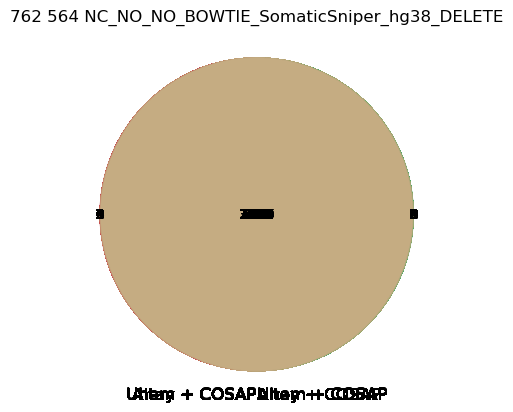

In [431]:
## SETS

count = 0;
for key in inter_testcase_dict:
    for key2 in inter_testcase_dict:
        if key != key2 and inter_testcase_dict[key] == inter_testcase_dict[key2]:
            set1 = sets_dict[key]
            set2 = sets_dict[key2]
            for index, row in vcfcomparison_df_full.iterrows():
                if row["TestCaseNo"].split(' ')[1] == key:
                    set1_env = row["Environment"]
                    
            for index, row in vcfcomparison_df_full.iterrows():
                if row["TestCaseNo"].split(' ')[1] == key2:
                    set2_env = row["Environment"]
                    break;
                    
            #if count % 2 == 0 :
            plt.rcdefaults()
            out = venn2([set1, set2], (set1_env,set2_env))
            
            plt.title(key + " " + key2 + " " + inter_testcase_dict[key])
            #plt.show()
             
            #count = count + 1
            

## 15 - Venn diagrams between Generated VCFs and High Confidence. (Environment)

KeyboardInterrupt: 

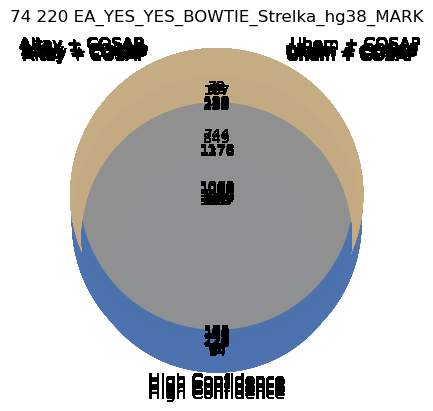

In [432]:
count = 0
for key in inter_testcase_dict:
    for key2 in inter_testcase_dict:
        if key != key2 and inter_testcase_dict[key] == inter_testcase_dict[key2]:
            set1 = sets_dict[key]
            set2 = sets_dict[key2]
            set3 = ll_sets_dict[inter_testcase_dict[key].split('_')[3].lower() +
                                '/' + inter_testcase_dict[key].split('_')[4].lower()]
           
            for index, row in vcfcomparison_df_full.iterrows():
                if row["TestCaseNo"].split(' ')[1] == key:
                    set1_env = row["Environment"]
                    
            for index, row in vcfcomparison_df_full.iterrows():
                if row["TestCaseNo"].split(' ')[1] == key2:
                    set2_env = row["Environment"]
                    break;
            #if count%2 == 0 :
                out = venn3([set1, set2, high_confidence], (set1_env,set2_env,'High Confidence' ))
                title = key + " " + key2 + " " + inter_testcase_dict[key]
                plt.title(title)
                
                script_dir = os.path.dirname('/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis/Results/')
                newFileName = inter_testcase_dict[key].split('_')[3] + '_' + inter_testcase_dict[key].split('_')[4] 
                results_dir = os.path.join(script_dir, newFileName)
                sample_file_name = title + '.png'
                
                if not os.path.isdir(results_dir):
                    os.makedirs(results_dir)
                
                #plt.savefig('/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis/' + )
                plt.savefig(results_dir +'/'+ sample_file_name)
                #plt.show()
            #count = count + 1

## 16 - Venn diagrams between Environments. 

In [433]:
count = 0
for key in inter_testcase_dict:
    for key2 in inter_testcase_dict:
        for key3 in inter_testcase_dict:
            if key != key2 and key2!=key3 and key!=key3 and inter_testcase_dict[key] == inter_testcase_dict[key2] and inter_testcase_dict[key2] == inter_testcase_dict[key3] and inter_testcase_dict[key] == inter_testcase_dict[key3]:
                set1 = sets_dict[key]
                set2 = sets_dict[key2]
                set3 = sets_dict[key3]

                for index, row in vcfcomparison_df_full.iterrows():
                    if row["TestCaseNo"].split(' ')[1] == key:
                        set1_env = row["Environment"]

                for index, row in vcfcomparison_df_full.iterrows():
                    if row["TestCaseNo"].split(' ')[1] == key2:
                        set2_env = row["Environment"]
                        break;

                for index, row in vcfcomparison_df_full.iterrows():
                    if row["TestCaseNo"].split(' ')[1] == key3:
                        set3_env = row["Environment"]
                        break;

                if count%2 == 0 :
                    out = venn3([set1, set2, set3], (set1_env,set2_env,set3_env))
                    title = key + " " + key2 + " " + key3 + " " + inter_testcase_dict[key]
                    plt.title(title)

                    script_dir = os.path.dirname('/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis/ResultsEnvironment/')
                    newFileName = inter_testcase_dict[key].split('_')[3] + '_' + inter_testcase_dict[key].split('_')[4] 
                    results_dir = os.path.join(script_dir, newFileName)
                    sample_file_name = title + '.png'

                    if not os.path.isdir(results_dir):
                        os.makedirs(results_dir)

                    #plt.savefig('/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis/' + )
                    plt.savefig(results_dir +'/'+ sample_file_name)
                    plt.show()
                count = count + 1